<a href="https://colab.research.google.com/github/gnodking7/PINN-California-Delta/blob/main/PINN_Fourier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Perform Fourier input encoding to avoid a phenomenon known as "spectral bias", a tendency of neural networks to be biased toward low-frequency solutions.

Specifically, the inputs are transformed to a higher dimensional feature space by high-frequency functions such that the neural network takes the form

$$u_{net}(x;\theta)=W_n\{\phi_{n-1}\circ\phi_{n-2}\circ\cdots\circ\phi_1\circ\phi_E\}(x)+b_n,\qquad\phi_i(x_i)=\sigma(W_ix_i+b_i)$$

where $u_{net}(x;\theta)$ is the neural network, $x\in\mathbb{R}^{d_0}$ is the input, $\phi_i\in\mathbb{R}^{d_i}$ is the $i$th layer, $W_i\in\mathbb{R}^{d_i\times d_{i-1}}$ and $b_i\in\mathbb{R}^{d_i}$ are the weight and bias, and $\sigma$ is the activation function. $\phi_E$ is the input encoding layer. If $\phi_E$ is the identity function, then we end up with a standard MLP. In the Fourier Network the encoding layer is defined as

$$\phi_E=\begin{bmatrix}\sin(2\pi fx)\\ \cos(2\pi fx)\end{bmatrix}$$

where $f\in\mathbb{R}^{n_f\times d_0}$ is the trainable frequency matrix.

# Preliminary Setup


## Install Packages

In [4]:
!pip install -q -U keras-tuner
!pip install deepxde

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 168.1/168.1 KB 17.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 77.5 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.4/150.4 KB 12.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.3/100.3 KB 15.5 MB/s eta 0:00:00


In [5]:
import keras_tuner
import numpy as np
import matplotlib.pylab as pl
import deepxde as dde
import pandas as pd
import tensorflow as tf
from tensorflow import keras

import sys
import os
import time

DeepXDE backend not selected or invalid. Use tensorflow.compat.v1.
Using backend: tensorflow.compat.v1

Instructions for updating:
non-resource variables are not supported in the long term


Setting the default backend to "tensorflow.compat.v1". You can change it in the ~/.deepxde/config.json file or export the DDE_BACKEND environment variable. Valid options are: tensorflow.compat.v1, tensorflow, pytorch, jax, paddle (all lowercase)
Enable just-in-time compilation with XLA.



## Read Data

### Read outflow and salinity data

In [6]:
### OPTIONAL, if mount manually by tab on left which is less work actually ###
# from google.colab import drive
# drive.mount('/content/drive',force_remount=True)

In [7]:
gdrive_root_path = os.path.join('/content/drive','My Drive','PINN')
sys.path.append(gdrive_root_path)

In [8]:
sys.path.append('/content/drive/My Drive/MAC/Python')

'''
The data is in an Excel file.
Daily DSM2 outflow and salinity at locations:
  Martinez  Port Chicago  Chipps Island
from Apr 1 1990 to Dec 28 2017
'''
df = pd.read_excel("/content/drive/My Drive/MAC/Python/PortChicago202210.xlsx", header=None)
All = np.asarray(df)
All = All[7:, :]  # Discard headers

for i in range(len(All)):
    All[i, 1] = str(All[i, 1])  # Change dates to str

In [9]:
def data_pre(year, daily, window, window_len):
    """
    Returns preprocessed outflow data for a given 'year' at locations
    Martinez, Port Chicago, Chipps Island such that
    to each day corresponds outflow data of length 'daily' + 'window'

    The preprocessed outflow data vector is created such that
    first 'daily' number of outflow (including current day) is included
    and prior 'window_len' many outflows are averaged 'window' many times

    PARAMETERS
    ----------
    year :        string or array of strings
                  Outflow year(s)
    daily :       int
                  number of outflow to include 'as-is'
    window :      int
                  number of average windows in return outflow
    window_len :  int
                  length of each window
    RETURNS
    -------
    M_OUT :       ndarray, shape (year length, daily+window)
                  Preprocessed outflow at Martinez
    P_OUT :       ndarray, shape (year length, daily+window)
                  Preprocessed outflow at Port Chicago
    C_OUT :       ndarray, shape (year length, daily+window)
                  Preprocessed outflow at Chipps Island
    """

    if type(year) == str:
        indices = np.flatnonzero(np.core.defchararray.find(list(All[:, 1]), year)!=-1)
    else:
        indices = []
        for yr in year:
            indices.extend(np.flatnonzero(np.core.defchararray.find(list(All[:, 1]), yr)!=-1))
    total = daily + window * window_len
    OUT_d = All[indices[0] - (total - 1):indices[-1] + 1, 2:5] # Range of outflow to extract outflow vector from
    OUT_d = np.flip(OUT_d, 1) # Locations are in reverse order, so flip data
    OUT_d = (OUT_d - np.min(OUT_d)) / (np.max(OUT_d) - np.min(OUT_d)) # Normalize

    ## Preprocessed outflow data for Martinez
    M_OUT = []
    cur = total - 1
    for i in range(len(indices)):
        vec = OUT_d[cur-(daily-1):cur+1, 0]
        vec = np.flip(vec)
        ind = cur - (daily - 1)
        for j in range(window):
            avg = np.mean(OUT_d[ind-window_len:ind, 0])
            vec = np.concatenate((vec, np.array([avg])))
            ind -= window_len
        M_OUT.append(vec)
        cur += 1
    M_OUT = np.array(M_OUT)

    ## Preprocessed outflow data for Port Chicago
    P_OUT = []
    cur = total - 1
    for i in range(len(indices)):
        vec = OUT_d[cur-(daily-1):cur+1, 1]
        vec = np.flip(vec)
        ind = cur - (daily - 1)
        for j in range(window):
            avg = np.mean(OUT_d[ind-window_len:ind, 1])
            vec = np.concatenate((vec, np.array([avg])))
            ind -= window_len
        P_OUT.append(vec)
        cur += 1
    P_OUT = np.array(P_OUT)

    ## Preprocessed outflow data for Chipps Island
    C_OUT = []
    cur = total - 1
    for i in range(len(indices)):
        vec = OUT_d[cur-(daily-1):cur+1, 2]
        vec = np.flip(vec)
        ind = cur - (daily - 1)
        for j in range(window):
            avg = np.mean(OUT_d[ind-window_len:ind, 2])
            vec = np.concatenate((vec, np.array([avg])))
            ind -= window_len
        C_OUT.append(vec)
        cur += 1
    C_OUT = np.array(C_OUT)

    return M_OUT, P_OUT, C_OUT

### Preprocess to create outflow vectors

In [10]:
# years = ['1991','1992','1993','1994','1995','1996','1997','1998','1999','2000','2001','2002','2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017']
years = ['1991','1992','1993','1994','1995','1996','1997','1998','1999','2000','2001','2002','2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015']

indices = []
for yr in years:
    indices.extend(np.flatnonzero(np.core.defchararray.find(list(All[:, 1]), yr)!=-1))
indices = np.array(indices)

EC_d = All[indices, 5:] # Salinity at three locations
EC_min = np.min(EC_d)
EC_max = np.max(EC_d)

'''
Create outflow data vectors at each location
To each day corresponds a 18-dim vector created from antecedent 118 outflow data:
  current day + previous 7 days + previous 110 days averaged into 10-dim values with window length 11
'''
M_OUT, P_OUT, C_OUT = data_pre(years, 8, 10, 11)

### Split data to 5-fold

In [11]:
def data_split(years, k):
    """
    Returns split EC data and inputs for ANN and PINN for each k-fold.

    PARAMETERS
    ----------
    years:     list of strings 
               indicates data years
    k:         int
               k-fold number
    RETURNS
    -------
    DATA_SET:  length k Hash Table with integer 1,2,...,k as keys
               each item contains a Hash Table of the following data:

               tr_indices:    ndarray (_)
                              training indices
               tst_indices:   ndarray (_)
                              testing indices
               tr_EC_d:       ndarray (_, 3)
                              training EC at three locations
               tst_EC_d:      ndarray (_, 3)
                              testing EC at three locations
               Q:             ndarray (_, 18)
                              training outflow inputs for ANN
               Q_tst:         ndarray (_, 18)
                              testing outflow inputs for ANN
               X:             ndarray (_, 20)
                              training inputs for PINN
               X_tst:         ndarray (_, 20)
                              testing inputs for PINN
               Svals:         ndarray (_)
                              training EC array
               Svals_tst:     ndarray (_)
                              testing EC array
    """
    DATA_SET = dict()
    TST_YEARS = np.split(np.array(years), k)  # split years into k folds

    cur_fold = 1

    for tst_years in TST_YEARS:
        tr_years = np.setdiff1d(years, tst_years)
        tr_indices = []
        for yr in tr_years:
            tr_indices.extend(np.flatnonzero(np.core.defchararray.find(list(All[:, 1]), yr)!=-1))
        tr_indices = np.array(tr_indices)

        tst_indices = []
        for yr in tst_years:
            tst_indices.extend(np.flatnonzero(np.core.defchararray.find(list(All[:, 1]), yr)!=-1))
        tst_indices = np.array(tst_indices)

        ## Training data
        tr_EC_d = All[tr_indices, 5:]
        tr_EC_d = np.flip(tr_EC_d, 1)
        tr_EC_d = (tr_EC_d - EC_min) / (EC_max - EC_min) # Normalize

        Q = []  # Inputs for ANN
        X = []  # Inputs for PINN
        Svals = []  # Outputs (same for both ANN and PINN)

        portion = 1 / (len(tr_indices) + len(tst_indices)) # to split the time domain [0, 1] uniformly

        for i in range(len(tr_EC_d)):
            cur_ind = tr_indices[i]
            for j in range(3):
                # Martinez
                if j == 0:
                    Q.append(M_OUT[cur_ind-275, :])
                    X.append(np.concatenate(([0, (cur_ind - 274) * portion], M_OUT[cur_ind-275, :])))
                # Port Chicago
                elif j == 1:
                    Q.append(P_OUT[cur_ind-275, :])
                    X.append(np.concatenate(([0.442, (cur_ind - 274) * portion], P_OUT[cur_ind-275, :])))
                # Chipps Island
                elif j == 2:
                    Q.append(C_OUT[cur_ind-275, :])
                    X.append(np.concatenate(([1, (cur_ind - 274) * portion], C_OUT[cur_ind-275, :])))
                Svals.append(tr_EC_d[i, j])

        Q = np.array(Q).astype('float32')
        X = np.array(X).astype('float32')
        Svals = np.array(Svals).astype('float32').flatten()[:, None]

        ## Testing data
        tst_EC_d = All[tst_indices, 5:]
        tst_EC_d = np.flip(tst_EC_d, 1)
        tst_EC_d = (tst_EC_d - EC_min) / (EC_max - EC_min) # Normalize

        Q_tst = []  # Validation inputs for ANN
        X_tst = []  # Validation inputs for PINN
        Svals_tst = []  # Validation outputs

        for i in range(len(tst_EC_d)):
            cur_ind = tst_indices[i]
            for j in range(3):
                # Martinez
                if j == 0:
                    Q_tst.append(M_OUT[cur_ind-275, :])
                    X_tst.append(np.concatenate(([0, (cur_ind - 274) * portion], M_OUT[cur_ind-275, :])))
                # Port Chicago
                elif j == 1:
                    Q_tst.append(P_OUT[cur_ind-275, :])
                    X_tst.append(np.concatenate(([0.442, (cur_ind - 274) * portion], P_OUT[cur_ind-275, :])))
                # Chipps Island
                elif j == 2:
                    Q_tst.append(C_OUT[cur_ind-275, :])
                    X_tst.append(np.concatenate(([1, (cur_ind - 274) * portion], C_OUT[cur_ind-275, :])))
                Svals_tst.append(tst_EC_d[i, j])

        Q_tst = np.array(Q_tst).astype('float32')
        X_tst = np.array(X_tst).astype('float32')
        Svals_tst = np.array(Svals_tst).astype('float32').flatten()[:, None]

        DATA_SET[cur_fold] = {'tr_indices':tr_indices, 'tst_indices':tst_indices, 'tr_EC_d':tr_EC_d, 'tst_EC_d':tst_EC_d, 
                              'Q':Q, 'Q_tst':Q_tst, 'X':X, 'X_tst':X_tst, 'Svals':Svals, 'Svals_tst':Svals_tst}
        cur_fold += 1

    return DATA_SET 

In [12]:
DATA_SET = data_split(years, 5)

## Define Evaluation Metrics

In [13]:
## Evaluation metrics
from collections import defaultdict
eval_metrics = ['MSE', 'Bias', 'R', 'RMSD', 'NSE', 'L2']

def evaluate_sequences(target, pred, metrics):
    assert len(target) == len(pred), 'Target and predicted sequence length must equal.'
    valid_entries = target>0
    sequence_length = np.sum(valid_entries)
    if np.any(sequence_length == 0):
        return {k: 0 for k in metrics}
    target=target[valid_entries]
    pred = pred[valid_entries]
    SD_pred = np.sqrt( np.sum((pred-np.mean(pred)) ** 2) /(sequence_length-1))
    SD_target = np.sqrt( np.sum((target-np.mean(target)) ** 2) /(sequence_length-1))

    eval_results = defaultdict(float)
    
    for m in metrics:
        if m =='MSE':
            eval_results[m] = ((target - pred)**2).mean()
        elif m =='Bias':
            eval_results[m] = np.sum(pred - target)/np.sum(target) * 100
        elif m == 'R':
            eval_results[m] = np.sum(np.abs((pred-np.mean(pred)) * (target - np.mean(target)))) / (sequence_length * SD_pred * SD_target)
        elif m == 'RMSD':
            eval_results[m] = np.sqrt(np.sum( ( ( pred-np.mean(pred) ) * ( target - np.mean(target) ) ) ** 2 ) / sequence_length)
        elif m == 'NSE':
            eval_results[m] = 1 - np.sum( ( target - pred ) ** 2 ) / np.sum( (target - np.mean(target) ) ** 2 )
        elif m == 'L2':
            eval_results[m] = dde.metrics.l2_relative_error(target, pred)
    return eval_results

# Optimal Hyper-parameters Search

### Set hyperparameters search space

In [18]:
""" 
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""
def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 0.002
        K = 133.959
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2)
    return loss

In [19]:
'''
Neural Network structure:
    1. Number of layers is preset to be

                                                  Act 1                Act 2
        Input Layer ----> Fourier Layer ----> Hidden Layer 1 ----> Hidden Layer 2 ----> Output Layer
    
    2. Possible number of neurons for Fourier Layer is [4, 8, 12, ..., 32]
    3. Possible number of neurons for Hidden Layer 1 is [4, 8, 12, ..., 32]
    4. Possible number of neurons for Hidden Layer 2 is [2, 4, 6, ..., 16]
    5. Possible activation function for all three activation functions is ["relu", "tanh", "elu", "sigmoid"]
'''

# Custom Layer - Fourier
class FoNet(keras.layers.Layer):
    def __init__(self, units=32, **kwargs):
        super().__init__(**kwargs)
        self.units = units

    def build(self, input_shape):
        self.w = self.add_weight(
            shape=(input_shape[-1], self.units),
            initializer="random_normal",
            trainable=True,
            name='name'
        )

    def call(self, inputs):
        out = 2 * np.pi * tf.matmul(inputs, self.w)
        return tf.concat([tf.math.sin(out), tf.math.cos(out)], 1)

    def get_config(self):
        config = super().get_config()
        config['units'] = self.units
        return config

def build_model(hp):
    # Hyperparameters
    act_func_1=hp.Choice("activation_1", ["relu","tanh","elu","sigmoid"])
    act_func_2=hp.Choice("activation_2", ["relu","tanh","elu","sigmoid"])
    hidden_units_1 = hp.Int("nhidden1", min_value=4, max_value=32, step=4)
    hidden_units_2 = hp.Int("nhidden2", min_value=4, max_value=32, step=4)
    hidden_units_3 = hp.Int("nhidden3", min_value=2, max_value=16, step=2)

    Inp = keras.layers.Input(shape=(20,))
    Fo = FoNet(hidden_units_1)(Inp)
    L1 = keras.layers.Dense(hidden_units_2, activation=act_func_1)(Fo)
    L2 = keras.layers.Dense(hidden_units_3, activation=act_func_2)(L1)
    Out = keras.layers.Dense(1, activation="linear")(L2)
    PINN_model = keras.Model(Inp, Out)
    PINN_model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))
    return PINN_model

build_model(keras_tuner.HyperParameters())

## Search and display optimal hyper-parameters


In [ ]:
X = DATA_SET[1]['X']
X_tst = DATA_SET[1]['X_tst']
Svals = DATA_SET[1]['Svals']
Svals_tst = DATA_SET[1]['Svals_tst']

tuner = keras_tuner.RandomSearch(
    hypermodel=build_model,
    objective="val_loss", # Find a set of hyperparameters that minimizes the validation loss
    max_trials=50,  # Randomly search for 50 sets
    executions_per_trial=2, # For each set, run twice
    overwrite=True,
)

tuner.search(X, Svals,
            epochs=3000,
            batch_size=128,
            validation_data=(X_tst, Svals_tst),
            callbacks=[
                keras.callbacks.EarlyStopping(
                    monitor="val_loss", patience=50, mode="min", restore_best_weights=True),
            ],
              verbose=0
            )

tuner.results_summary()

/usr/local/lib/python3.8/dist-packages/keras/engine/training_v1.py:2045: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


Results summary
Results in ./untitled_project
Showing 10 best trials
Trial summary
Hyperparameters:
activation_1: relu
activation_2: relu
nhidden1: 4
nhidden2: 8
nhidden3: 8
Score: 0.005620729075418326
Trial summary
Hyperparameters:
activation_1: elu
activation_2: relu
nhidden1: 4
nhidden2: 8
nhidden3: 16
Score: 0.005830339932108353
Trial summary
Hyperparameters:
activation_1: relu
activation_2: tanh
nhidden1: 24
nhidden2: 32
nhidden3: 6
Score: 0.0062254907697807775
Trial summary
Hyperparameters:
activation_1: relu
activation_2: elu
nhidden1: 32
nhidden2: 32
nhidden3: 2
Score: 0.006452453638164803
Trial summary
Hyperparameters:
activation_1: elu
activation_2: relu
nhidden1: 32
nhidden2: 12
nhidden3: 14
Score: 0.006776701886694458
Trial summary
Hyperparameters:
activation_1: relu
activation_2: sigmoid
nhidden1: 20
nhidden2: 24
nhidden3: 14
Score: 0.007043709029032475
Trial summary
Hyperparameters:
activation_1: relu
activation_2: elu
nhidden1: 24
nhidden2: 16
nhidden3: 16
Score: 0.00711

In [ ]:
X = DATA_SET[2]['X']
X_tst = DATA_SET[2]['X_tst']
Svals = DATA_SET[2]['Svals']
Svals_tst = DATA_SET[2]['Svals_tst']

tuner = keras_tuner.RandomSearch(
    hypermodel=build_model,
    objective="val_loss", # Find a set of hyperparameters that minimizes the validation loss
    max_trials=50,  # Randomly search for 50 sets
    executions_per_trial=2, # For each set, run twice
    overwrite=True,
)

tuner.search(X, Svals,
            epochs=3000,
            batch_size=128,
            validation_data=(X_tst, Svals_tst),
            callbacks=[
                keras.callbacks.EarlyStopping(
                    monitor="val_loss", patience=50, mode="min", restore_best_weights=True),
            ],
              verbose=0
            )

tuner.results_summary()

/usr/local/lib/python3.8/dist-packages/keras/engine/training_v1.py:2045: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


Results summary
Results in ./untitled_project
Showing 10 best trials
Trial summary
Hyperparameters:
activation_1: relu
activation_2: tanh
nhidden1: 24
nhidden2: 24
nhidden3: 6
Score: 0.0035333799981083765
Trial summary
Hyperparameters:
activation_1: relu
activation_2: elu
nhidden1: 24
nhidden2: 28
nhidden3: 4
Score: 0.0035857382488141847
Trial summary
Hyperparameters:
activation_1: relu
activation_2: sigmoid
nhidden1: 28
nhidden2: 8
nhidden3: 16
Score: 0.003840644822657806
Trial summary
Hyperparameters:
activation_1: relu
activation_2: relu
nhidden1: 12
nhidden2: 28
nhidden3: 12
Score: 0.0038531352950432
Trial summary
Hyperparameters:
activation_1: relu
activation_2: elu
nhidden1: 20
nhidden2: 24
nhidden3: 4
Score: 0.0038570645228748752
Trial summary
Hyperparameters:
activation_1: relu
activation_2: tanh
nhidden1: 28
nhidden2: 20
nhidden3: 12
Score: 0.003940631637165024
Trial summary
Hyperparameters:
activation_1: relu
activation_2: tanh
nhidden1: 16
nhidden2: 24
nhidden3: 2
Score: 0.0

In [76]:
X = DATA_SET[3]['X']
X_tst = DATA_SET[3]['X_tst']
Svals = DATA_SET[3]['Svals']
Svals_tst = DATA_SET[3]['Svals_tst']

tuner = keras_tuner.RandomSearch(
    hypermodel=build_model,
    objective="val_loss", # Find a set of hyperparameters that minimizes the validation loss
    max_trials=50,  # Randomly search for 50 sets
    executions_per_trial=2, # For each set, run twice
    overwrite=True,
)

tuner.search(X, Svals,
            epochs=3000,
            batch_size=128,
            validation_data=(X_tst, Svals_tst),
            callbacks=[
                keras.callbacks.EarlyStopping(
                    monitor="val_loss", patience=50, mode="min", restore_best_weights=True),
            ],
              verbose=0
            )

tuner.results_summary()

/usr/local/lib/python3.8/dist-packages/keras/engine/training_v1.py:2045: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


Results summary
Results in ./untitled_project
Showing 10 best trials
Trial summary
Hyperparameters:
activation_1: tanh
activation_2: tanh
nhidden1: 16
nhidden2: 32
nhidden3: 10
Score: 0.0032499529347884562
Trial summary
Hyperparameters:
activation_1: sigmoid
activation_2: relu
nhidden1: 32
nhidden2: 32
nhidden3: 8
Score: 0.004166768486414332
Trial summary
Hyperparameters:
activation_1: relu
activation_2: relu
nhidden1: 12
nhidden2: 12
nhidden3: 16
Score: 0.004362188276143519
Trial summary
Hyperparameters:
activation_1: relu
activation_2: elu
nhidden1: 20
nhidden2: 16
nhidden3: 10
Score: 0.0044039671369476355
Trial summary
Hyperparameters:
activation_1: tanh
activation_2: tanh
nhidden1: 16
nhidden2: 12
nhidden3: 16
Score: 0.004416779913950076
Trial summary
Hyperparameters:
activation_1: relu
activation_2: sigmoid
nhidden1: 16
nhidden2: 8
nhidden3: 14
Score: 0.004443128966908615
Trial summary
Hyperparameters:
activation_1: relu
activation_2: elu
nhidden1: 20
nhidden2: 12
nhidden3: 4
Scor

In [14]:
X = DATA_SET[4]['X']
X_tst = DATA_SET[4]['X_tst']
Svals = DATA_SET[4]['Svals']
Svals_tst = DATA_SET[4]['Svals_tst']

tuner = keras_tuner.RandomSearch(
    hypermodel=build_model,
    objective="val_loss", # Find a set of hyperparameters that minimizes the validation loss
    max_trials=50,  # Randomly search for 50 sets
    executions_per_trial=2, # For each set, run twice
    overwrite=True,
)

tuner.search(X, Svals,
            epochs=3000,
            batch_size=128,
            validation_data=(X_tst, Svals_tst),
            callbacks=[
                keras.callbacks.EarlyStopping(
                    monitor="val_loss", patience=50, mode="min", restore_best_weights=True),
            ],
              verbose=0
            )

tuner.results_summary()

/usr/local/lib/python3.8/dist-packages/keras/engine/training_v1.py:2045: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


Results summary
Results in ./untitled_project
Showing 10 best trials
Trial summary
Hyperparameters:
activation_1: elu
activation_2: tanh
nhidden1: 28
nhidden2: 28
nhidden3: 16
Score: 0.0037055190656179113
Trial summary
Hyperparameters:
activation_1: sigmoid
activation_2: tanh
nhidden1: 32
nhidden2: 28
nhidden3: 12
Score: 0.003909447931313249
Trial summary
Hyperparameters:
activation_1: elu
activation_2: tanh
nhidden1: 24
nhidden2: 28
nhidden3: 4
Score: 0.004406281204757495
Trial summary
Hyperparameters:
activation_1: sigmoid
activation_2: sigmoid
nhidden1: 28
nhidden2: 12
nhidden3: 2
Score: 0.00448814782499485
Trial summary
Hyperparameters:
activation_1: relu
activation_2: tanh
nhidden1: 28
nhidden2: 20
nhidden3: 12
Score: 0.004539372619274118
Trial summary
Hyperparameters:
activation_1: relu
activation_2: elu
nhidden1: 12
nhidden2: 28
nhidden3: 6
Score: 0.004546291908394109
Trial summary
Hyperparameters:
activation_1: relu
activation_2: elu
nhidden1: 4
nhidden2: 20
nhidden3: 16
Score:

In [14]:
X = DATA_SET[5]['X']
X_tst = DATA_SET[5]['X_tst']
Svals = DATA_SET[5]['Svals']
Svals_tst = DATA_SET[5]['Svals_tst']

tuner = keras_tuner.RandomSearch(
    hypermodel=build_model,
    objective="val_loss", # Find a set of hyperparameters that minimizes the validation loss
    max_trials=50,  # Randomly search for 50 sets
    executions_per_trial=2, # For each set, run twice
    overwrite=True,
)

tuner.search(X, Svals,
            epochs=3000,
            batch_size=128,
            validation_data=(X_tst, Svals_tst),
            callbacks=[
                keras.callbacks.EarlyStopping(
                    monitor="val_loss", patience=50, mode="min", restore_best_weights=True),
            ],
              verbose=0
            )

tuner.results_summary()

/usr/local/lib/python3.8/dist-packages/keras/engine/training_v1.py:2045: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


Results summary
Results in ./untitled_project
Showing 10 best trials
Trial summary
Hyperparameters:
activation_1: sigmoid
activation_2: sigmoid
nhidden1: 24
nhidden2: 20
nhidden3: 16
Score: 0.0055088327417076016
Trial summary
Hyperparameters:
activation_1: elu
activation_2: relu
nhidden1: 16
nhidden2: 28
nhidden3: 10
Score: 0.005596450843663656
Trial summary
Hyperparameters:
activation_1: relu
activation_2: elu
nhidden1: 32
nhidden2: 24
nhidden3: 10
Score: 0.00562004359701173
Trial summary
Hyperparameters:
activation_1: relu
activation_2: elu
nhidden1: 4
nhidden2: 28
nhidden3: 16
Score: 0.005648428690152235
Trial summary
Hyperparameters:
activation_1: relu
activation_2: sigmoid
nhidden1: 16
nhidden2: 20
nhidden3: 6
Score: 0.005664992924166253
Trial summary
Hyperparameters:
activation_1: relu
activation_2: elu
nhidden1: 4
nhidden2: 28
nhidden3: 12
Score: 0.005705642484008787
Trial summary
Hyperparameters:
activation_1: relu
activation_2: elu
nhidden1: 16
nhidden2: 28
nhidden3: 12
Score:

# Train ANN and PINN models

For each fold, three models are considered


1.   ANN (MLP)
2.   PINN (MLP)
3.   PINN (FoNet)

Optimal hyperparameters are computed and used separately for each model



## 5-fold (Test: 1991-1995)

In [57]:
"""
Load data
"""
Q = DATA_SET[1]['Q']
Q_tst = DATA_SET[1]['Q_tst']
X = DATA_SET[1]['X']
X_tst = DATA_SET[1]['X_tst']
Svals = DATA_SET[1]['Svals']
Svals_tst = DATA_SET[1]['Svals_tst']

"""
Function for computing NN running time 
"""
class TimeHistory(keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.times = []

    def on_epoch_begin(self, epoch, logs={}):
        self.epoch_time_start = time.time()

    def on_epoch_end(self, epoch, logs={}):
        self.times.append(time.time() - self.epoch_time_start)

time_callback = TimeHistory()

### Load models (if saved)

In [14]:
# Load model
model_path_prefix = "ANN_5fold_1 (ANN_best)"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
ANN_model1 = keras.models.load_model(model_savepath)

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


In [15]:
# Load model
model_path_prefix = "PINN_5fold_1"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
PINN_model1 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [20]:
# Load model (if saved already)
model_path_prefix = "PINN_5fold_1 (FoNet)"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
PINN_Fo_model1 = keras.models.load_model(model_savepath, compile=False, custom_objects={'FoNet': FoNet})  # compile=False necessary for custom loss issue

### ANN

Hyperparameters:
*   activation_1: relu
*   activation_2: tanh
*   activation_3: sigmoid
*   nhidden1: 28
*   nhidden2: 6

In [ ]:
## Print evaluation results

train_results = evaluate_sequences(Svals, np.maximum(ANN_model1.predict(Q), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(ANN_model1.predict(Q_tst), 0), eval_metrics)

print("ANN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("ANN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

ANN results for training
------------------------------
MSE : 0.0065793367
Bias : -2.279055491089821
R : 0.9623495802951832
RMSD : 0.09179586425843951
NSE : 0.9143525511026382
L2 : 0.16616885


ANN results for testing
------------------------------
MSE : 0.0066095195
Bias : 2.435900457203388
R : 0.968611293586428
RMSD : 0.101977627268077
NSE : 0.9245484173297882
L2 : 0.15297094


### PINN

Hyperparameters:
*   activation_1: elu
*   activation_2: relu
*   activation_3: elu
*   nhidden1: 8
*   nhidden2: 12

In [ ]:
## Print evaluation results

train_results = evaluate_sequences(Svals, np.maximum(PINN_model1.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(PINN_model1.predict(X_tst), 0), eval_metrics)

print("PINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("PINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

PINN results for training
------------------------------
MSE : 0.0046538194
Bias : -1.6987666487693787
R : 0.973290874878345
RMSD : 0.09222421807108995
NSE : 0.9394182488322258
L2 : 0.13975368


PINN results for testing
------------------------------
MSE : 0.006322793
Bias : 4.331333935260773
R : 0.9733074955138812
RMSD : 0.10073412985118953
NSE : 0.9278215691447258
L2 : 0.14961617


### PINN (FoNet)

Hyperparameters:
*   activation_1: relu
*   activation_2: relu
*   nhidden1: 4
*   nhidden2: 8
*   nhidden3: 8


In [46]:
""" 
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""
def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 0.002
        K = 133.959
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
Fo = FoNet(4)(Inp)
L1 = keras.layers.Dense(8, activation='relu')(Fo)
L2 = keras.layers.Dense(8, activation='relu')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        time_callback      
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21760/21915 [============================>.] - ETA: 0s - loss: 0.0771

/usr/local/lib/python3.8/dist-packages/keras/engine/training_v1.py:2045: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


21915/21915 [==============================] - 1s 67us/sample - loss: 0.0767 - val_loss: 0.0317
Epoch 2/5000
21915/21915 [==============================] - 1s 37us/sample - loss: 0.0139 - val_loss: 0.0178
Epoch 3/5000
21915/21915 [==============================] - 1s 36us/sample - loss: 0.0095 - val_loss: 0.0126
Epoch 4/5000
21915/21915 [==============================] - 1s 39us/sample - loss: 0.0080 - val_loss: 0.0104
Epoch 5/5000
21915/21915 [==============================] - 1s 38us/sample - loss: 0.0073 - val_loss: 0.0095
Epoch 6/5000
21915/21915 [==============================] - 1s 39us/sample - loss: 0.0070 - val_loss: 0.0088
Epoch 7/5000
21915/21915 [==============================] - 1s 39us/sample - loss: 0.0067 - val_loss: 0.0082
Epoch 8/5000
21915/21915 [==============================] - 1s 36us/sample - loss: 0.0065 - val_loss: 0.0080
Epoch 9/5000
21915/21915 [==============================] - 1s 39us/sample - loss: 0.0065 - val_loss: 0.0076
Epoch 10/5000
21915/21915 [=====

In [50]:
## Print evaluation results

PINN_Fo_model1 = model

train_results = evaluate_sequences(Svals, np.maximum(PINN_Fo_model1.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(PINN_Fo_model1.predict(X_tst), 0), eval_metrics)

print("PINN (FoNet) results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("PINN (FoNet) results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

PINN (FoNet) results for training
------------------------------
MSE : 0.0040130094
Bias : -2.0261241123080254
R : 0.9767787876947185
RMSD : 0.0934282571459002
NSE : 0.9477600827813148
L2 : 0.12977579


PINN (FoNet) results for testing
------------------------------
MSE : 0.0051608253
Bias : 1.7834024503827095
R : 0.9776842895321252
RMSD : 0.09911333958432256
NSE : 0.9410861246287823
L2 : 0.135171


In [48]:
## Save model
model_path_prefix = "PINN_5fold_1 (FoNet)"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
PINN_Fo_model1.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/PINN_5fold_1 (FoNet)


## 5-fold (Test: 1996-2000)

In [54]:
"""
Load data
"""
Q = DATA_SET[2]['Q']
Q_tst = DATA_SET[2]['Q_tst']
X = DATA_SET[2]['X']
X_tst = DATA_SET[2]['X_tst']
Svals = DATA_SET[2]['Svals']
Svals_tst = DATA_SET[2]['Svals_tst']

"""
Function for computing NN running time 
"""
class TimeHistory(keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.times = []

    def on_epoch_begin(self, epoch, logs={}):
        self.epoch_time_start = time.time()

    def on_epoch_end(self, epoch, logs={}):
        self.times.append(time.time() - self.epoch_time_start)

time_callback = TimeHistory()

### Load models (if saved)

In [21]:
# Load model
model_path_prefix = "ANN_5fold_2 (ANN_best)"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
ANN_model2 = keras.models.load_model(model_savepath)

In [22]:
# Load model
model_path_prefix = "PINN_5fold_2"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
PINN_model2 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [23]:
# Load model (if saved already)
model_path_prefix = "PINN_5fold_2 (FoNet)"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
PINN_Fo_model2 = keras.models.load_model(model_savepath, compile=False, custom_objects={'FoNet': FoNet})  # compile=False necessary for custom loss issue

### ANN

Hyperparameters:
*   activation_1: elu
*   activation_2: elu
*   activation_3: sigmoid
*   nhidden1: 32
*   nhidden2: 8

In [ ]:
## Print evaluation results

train_results = evaluate_sequences(Svals, np.maximum(ANN_model2.predict(Q), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(ANN_model2.predict(Q_tst), 0), eval_metrics)

print("ANN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("ANN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

/usr/local/lib/python3.8/dist-packages/keras/engine/training_v1.py:2067: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


ANN results for training
------------------------------
MSE : 0.007066233
Bias : 2.924979105591774
R : 0.9609780220591356
RMSD : 0.09723871211575098
NSE : 0.9092059582471848
L2 : 0.16043141


ANN results for testing
------------------------------
MSE : 0.005073019
Bias : -3.9392121136188507
R : 0.9639201296178462
RMSD : 0.07650264523907795
NSE : 0.9181823655962944
L2 : 0.19212575


### PINN

Hyperparameters:
*   activation_1: relu
*   activation_2: tanh
*   activation_3: tanh
*   nhidden1: 32
*   nhidden2: 10

In [ ]:
## Print evaluation results

train_results = evaluate_sequences(Svals, np.maximum(PINN_model2.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(PINN_model2.predict(X_tst), 0), eval_metrics)

print("PINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("PINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

/usr/local/lib/python3.8/dist-packages/keras/engine/training_v1.py:2067: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


PINN results for training
------------------------------
MSE : 0.0039747218
Bias : 5.2728477865457535
R : 0.979863492417712
RMSD : 0.09646143146231478
NSE : 0.9489287920296192
L2 : 0.12032305


PINN results for testing
------------------------------
MSE : 0.0027278583
Bias : -0.8729451335966587
R : 0.98086279198256
RMSD : 0.07730389204859205
NSE : 0.9560051076114178
L2 : 0.14088452


### PINN (FoNet)

Hyperparameters:
*   activation_1: relu
*   activation_2: tanh
*   nhidden1: 24
*   nhidden2: 24
*   nhidden3: 6


In [59]:
""" 
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""
def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 0.002
        K = 133.959
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
Fo = FoNet(24)(Inp)
L1 = keras.layers.Dense(24, activation='relu')(Fo)
L2 = keras.layers.Dense(6, activation='tanh')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        time_callback      
                                ],
                    )

Train on 21912 samples, validate on 5481 samples
Epoch 1/5000
21912/21912 [==============================] - 2s 89us/sample - loss: 0.0350 - val_loss: 0.0095
Epoch 2/5000
21912/21912 [==============================] - 1s 42us/sample - loss: 0.0113 - val_loss: 0.0064
Epoch 3/5000
21912/21912 [==============================] - 1s 43us/sample - loss: 0.0079 - val_loss: 0.0054
Epoch 4/5000
21912/21912 [==============================] - 1s 42us/sample - loss: 0.0067 - val_loss: 0.0045
Epoch 5/5000
21912/21912 [==============================] - 1s 41us/sample - loss: 0.0061 - val_loss: 0.0046
Epoch 6/5000
21912/21912 [==============================] - 1s 41us/sample - loss: 0.0058 - val_loss: 0.0053
Epoch 7/5000
21912/21912 [==============================] - 1s 40us/sample - loss: 0.0057 - val_loss: 0.0085
Epoch 8/5000
21912/21912 [==============================] - 1s 41us/sample - loss: 0.0057 - val_loss: 0.0048
Epoch 9/5000
21912/21912 [==============================] - 1s 44us/sample - lo

In [60]:
## Print evaluation results

PINN_Fo_model2 = model

train_results = evaluate_sequences(Svals, np.maximum(PINN_Fo_model2.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(PINN_Fo_model2.predict(X_tst), 0), eval_metrics)

print("PINN (FoNet) results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("PINN (FoNet) results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

PINN (FoNet) results for training
------------------------------
MSE : 0.0051092547
Bias : 8.398211002349854
R : 0.978593469710643
RMSD : 0.10258173822415793
NSE : 0.9343511685729027
L2 : 0.13641879


PINN (FoNet) results for testing
------------------------------
MSE : 0.0029972305
Bias : -1.1266667395830154
R : 0.9779256656977925
RMSD : 0.07901695135297723
NSE : 0.9516606740653515
L2 : 0.14767684


In [61]:
## Save model
model_path_prefix = "PINN_5fold_2 (FoNet)"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
PINN_Fo_model2.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/PINN_5fold_2 (FoNet)


## 5-fold (Test: 2001-2005)

In [73]:
"""
Load data
"""
Q = DATA_SET[3]['Q']
Q_tst = DATA_SET[3]['Q_tst']
X = DATA_SET[3]['X']
X_tst = DATA_SET[3]['X_tst']
Svals = DATA_SET[3]['Svals']
Svals_tst = DATA_SET[3]['Svals_tst']

"""
Function for computing NN running time 
"""
class TimeHistory(keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.times = []

    def on_epoch_begin(self, epoch, logs={}):
        self.epoch_time_start = time.time()

    def on_epoch_end(self, epoch, logs={}):
        self.times.append(time.time() - self.epoch_time_start)

time_callback = TimeHistory()

### Load models (if saved)

In [24]:
# Load model
model_path_prefix = "ANN_5fold_3 (ANN_best)"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
ANN_model3 = keras.models.load_model(model_savepath)

In [25]:
# Load model
model_path_prefix = "PINN_5fold_3"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
PINN_model3 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [26]:
# Load model (if saved already)
model_path_prefix = "PINN_5fold_3 (FoNet)"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
PINN_Fo_model3 = keras.models.load_model(model_savepath, compile=False, custom_objects={'FoNet': FoNet})  # compile=False necessary for custom loss issue

### ANN

Hyperparameters:
*   activation_1: relu
*   activation_2: sigmoid
*   activation_3: tanh
*   nhidden1: 20
*   nhidden2: 6

In [82]:
## Print evaluation results

train_results = evaluate_sequences(Svals, np.maximum(ANN_model3.predict(Q), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(ANN_model3.predict(Q_tst), 0), eval_metrics)

print("ANN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("ANN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

/usr/local/lib/python3.8/dist-packages/keras/engine/training_v1.py:2067: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


ANN results for training
------------------------------
MSE : 0.006149479
Bias : -1.0632354766130447
R : 0.9679837210805966
RMSD : 0.09778841050358922
NSE : 0.9256963282823563
L2 : 0.1553069


ANN results for testing
------------------------------
MSE : 0.0069538653
Bias : 0.22446748334914446
R : 0.9516811132794083
RMSD : 0.0764895204500395
NSE : 0.8922504857182503
L2 : 0.17952782


### PINN

Hyperparameters:
*   activation_1: relu
*   activation_2: elu
*   activation_3: tanh
*   nhidden1: 16
*   nhidden2: 10

In [84]:
## Print evaluation results

train_results = evaluate_sequences(Svals, np.maximum(PINN_model3.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(PINN_model3.predict(X_tst), 0), eval_metrics)

print("PINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("PINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

/usr/local/lib/python3.8/dist-packages/keras/engine/training_v1.py:2067: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


PINN results for training
------------------------------
MSE : 0.0042133797
Bias : -3.1039148569107056
R : 0.9777828900579332
RMSD : 0.10059138317397853
NSE : 0.9490900710225105
L2 : 0.12855437


PINN results for testing
------------------------------
MSE : 0.0048033223
Bias : 1.147189550101757
R : 0.9660437139319822
RMSD : 0.07924345472137426
NSE : 0.9255729541182518
L2 : 0.14920709


### PINN (FoNet)

Hyperparameters:
*   activation_1: tanh
*   activation_2: tanh
*   nhidden1: 16
*   nhidden2: 32
*   nhidden3: 10


In [76]:
""" 
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""
def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 0.002
        K = 133.959
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
Fo = FoNet(16)(Inp)
L1 = keras.layers.Dense(32, activation='tanh')(Fo)
L2 = keras.layers.Dense(10, activation='tanh')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        time_callback      
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21915/21915 [==============================] - 3s 118us/sample - loss: 0.0418 - val_loss: 0.0197
Epoch 2/5000
21915/21915 [==============================] - 1s 43us/sample - loss: 0.0172 - val_loss: 0.0136
Epoch 3/5000
21915/21915 [==============================] - 1s 42us/sample - loss: 0.0113 - val_loss: 0.0100
Epoch 4/5000
21915/21915 [==============================] - 1s 42us/sample - loss: 0.0089 - val_loss: 0.0092
Epoch 5/5000
21915/21915 [==============================] - 1s 42us/sample - loss: 0.0082 - val_loss: 0.0085
Epoch 6/5000
21915/21915 [==============================] - 1s 42us/sample - loss: 0.0076 - val_loss: 0.0085
Epoch 7/5000
21915/21915 [==============================] - 1s 41us/sample - loss: 0.0074 - val_loss: 0.0078
Epoch 8/5000
21915/21915 [==============================] - 1s 43us/sample - loss: 0.0071 - val_loss: 0.0076
Epoch 9/5000
21915/21915 [==============================] - 1s 42us/sample - l

In [77]:
## Print evaluation results

PINN_Fo_model3 = model

train_results = evaluate_sequences(Svals, np.maximum(PINN_Fo_model3.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(PINN_Fo_model3.predict(X_tst), 0), eval_metrics)

print("PINN (FoNet) results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("PINN (FoNet) results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

PINN (FoNet) results for training
------------------------------
MSE : 0.003356265
Bias : -3.9862263947725296
R : 0.9833372141533957
RMSD : 0.10197343111994621
NSE : 0.959446519613266
L2 : 0.11473598


PINN (FoNet) results for testing
------------------------------
MSE : 0.003989469
Bias : -1.7300913110375404
R : 0.9732529749154128
RMSD : 0.0780605243697235
NSE : 0.9381835460662842
L2 : 0.13598034


In [78]:
## Save model
model_path_prefix = "PINN_5fold_3 (FoNet)"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
PINN_Fo_model3.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/PINN_5fold_3 (FoNet)


## 5-fold (Test: 2006-2010)

In [80]:
"""
Load data
"""
Q = DATA_SET[4]['Q']
Q_tst = DATA_SET[4]['Q_tst']
X = DATA_SET[4]['X']
X_tst = DATA_SET[4]['X_tst']
Svals = DATA_SET[4]['Svals']
Svals_tst = DATA_SET[4]['Svals_tst']

"""
Function for computing NN running time 
"""
class TimeHistory(keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.times = []

    def on_epoch_begin(self, epoch, logs={}):
        self.epoch_time_start = time.time()

    def on_epoch_end(self, epoch, logs={}):
        self.times.append(time.time() - self.epoch_time_start)

time_callback = TimeHistory()

### Load models (if saved)

In [27]:
# Load model
model_path_prefix = "ANN_5fold_4 (ANN_best)"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
ANN_model4 = keras.models.load_model(model_savepath)

In [28]:
# Load model
model_path_prefix = "PINN_5fold_4"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
PINN_model4 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [29]:
# Load model (if saved already)
model_path_prefix = "PINN_5fold_4 (FoNet)"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
PINN_Fo_model4 = keras.models.load_model(model_savepath, compile=False, custom_objects={'FoNet': FoNet})  # compile=False necessary for custom loss issue

### ANN

Hyperparameters:
*   activation_1: tanh
*   activation_2: sigmoid
*   activation_3: sigmoid
*   nhidden1: 20
*   nhidden2: 8

In [18]:
## Print evaluation results

train_results = evaluate_sequences(Svals, np.maximum(ANN_model4.predict(Q), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(ANN_model4.predict(Q_tst), 0), eval_metrics)

print("ANN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("ANN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

/usr/local/lib/python3.8/dist-packages/keras/engine/training_v1.py:2067: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


ANN results for training
------------------------------
MSE : 0.006525013
Bias : -2.8011055663228035
R : 0.9662192360976225
RMSD : 0.09429956429348083
NSE : 0.9191883355379105
L2 : 0.16386415


ANN results for testing
------------------------------
MSE : 0.0067387847
Bias : 0.6166820880025625
R : 0.9571637890316115
RMSD : 0.0891683314732981
NSE : 0.9066592678427696
L2 : 0.15990439


### PINN

Hyperparameters:
*   activation_1: tanh
*   activation_2: relu
*   activation_3: sigmoid
*   nhidden1: 24
*   nhidden2: 14

In [20]:
## Print evaluation results

train_results = evaluate_sequences(Svals, np.maximum(PINN_model4.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(PINN_model4.predict(X_tst), 0), eval_metrics)

print("PINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("PINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

/usr/local/lib/python3.8/dist-packages/keras/engine/training_v1.py:2067: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


PINN results for training
------------------------------
MSE : 0.0036007145
Bias : -1.8491998314857483
R : 0.9805716529985933
RMSD : 0.09755427132940958
NSE : 0.9554054923355579
L2 : 0.12172719


PINN results for testing
------------------------------
MSE : 0.003975367
Bias : 2.608897164463997
R : 0.9746707714312438
RMSD : 0.09153858922973249
NSE : 0.9449361115694046
L2 : 0.12281694


### PINN (FoNet)

Hyperparameters:
*   activation_1: elu
*   activation_2: tanh
*   nhidden1: 28
*   nhidden2: 28
*   nhidden3: 16

In [85]:
""" 
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""
def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 0.002
        K = 133.959
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
Fo = FoNet(28)(Inp)
L1 = keras.layers.Dense(28, activation='elu')(Fo)
L2 = keras.layers.Dense(16, activation='tanh')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        time_callback      
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21915/21915 [==============================] - 3s 129us/sample - loss: 0.0254 - val_loss: 0.0170
Epoch 2/5000
21915/21915 [==============================] - 1s 42us/sample - loss: 0.0104 - val_loss: 0.0099
Epoch 3/5000
21915/21915 [==============================] - 1s 54us/sample - loss: 0.0090 - val_loss: 0.0080
Epoch 4/5000
21915/21915 [==============================] - 1s 63us/sample - loss: 0.0077 - val_loss: 0.0084
Epoch 5/5000
21915/21915 [==============================] - 1s 67us/sample - loss: 0.0074 - val_loss: 0.0077
Epoch 6/5000
21915/21915 [==============================] - 1s 45us/sample - loss: 0.0073 - val_loss: 0.0072
Epoch 7/5000
21915/21915 [==============================] - 1s 42us/sample - loss: 0.0070 - val_loss: 0.0071
Epoch 8/5000
21915/21915 [==============================] - 1s 42us/sample - loss: 0.0067 - val_loss: 0.0070
Epoch 9/5000
21915/21915 [==============================] - 1s 42us/sample - l

In [86]:
## Print evaluation results

PINN_Fo_model4 = model

train_results = evaluate_sequences(Svals, np.maximum(PINN_Fo_model4.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(PINN_Fo_model4.predict(X_tst), 0), eval_metrics)

print("PINN (FoNet) results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("PINN (FoNet) results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

PINN (FoNet) results for training
------------------------------
MSE : 0.0021789821
Bias : -1.1988845653831959
R : 0.9880747970773639
RMSD : 0.10187578775222753
NSE : 0.9730135146528482
L2 : 0.09469348


PINN (FoNet) results for testing
------------------------------
MSE : 0.0031824391
Bias : 0.439108582213521
R : 0.9795822213558436
RMSD : 0.09226650346640115
NSE : 0.9559191763401031
L2 : 0.10988785


In [87]:
## Save model
model_path_prefix = "PINN_5fold_4 (FoNet)"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
PINN_Fo_model4.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/PINN_5fold_4 (FoNet)


## 5-fold (Test: 2011-2015)

In [89]:
"""
Load data
"""
Q = DATA_SET[5]['Q']
Q_tst = DATA_SET[5]['Q_tst']
X = DATA_SET[5]['X']
X_tst = DATA_SET[5]['X_tst']
Svals = DATA_SET[5]['Svals']
Svals_tst = DATA_SET[5]['Svals_tst']

"""
Function for computing NN running time 
"""
class TimeHistory(keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.times = []

    def on_epoch_begin(self, epoch, logs={}):
        self.epoch_time_start = time.time()

    def on_epoch_end(self, epoch, logs={}):
        self.times.append(time.time() - self.epoch_time_start)

time_callback = TimeHistory()

### Load models (if saved)

In [30]:
# Load model
model_path_prefix = "ANN_5fold_5 (ANN_best)"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
ANN_model5 = keras.models.load_model(model_savepath)

In [31]:
# Load model
model_path_prefix = "PINN_5fold_5"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
PINN_model5 = keras.models.load_model(model_savepath, compile=False)  # compile=False necessary for custom loss issue

In [32]:
# Load model (if saved already)
model_path_prefix = "PINN_5fold_5 (FoNet)"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
PINN_Fo_model5 = keras.models.load_model(model_savepath, compile=False, custom_objects={'FoNet': FoNet})  # compile=False necessary for custom loss issue

### ANN

Hyperparameters:
*   activation_1: elu
*   activation_2: tanh
*   activation_3: sigmoid
*   nhidden1: 32
*   nhidden2: 14

In [19]:
## Print evaluation results

train_results = evaluate_sequences(Svals, np.maximum(ANN_model5.predict(Q), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(ANN_model5.predict(Q_tst), 0), eval_metrics)

print("ANN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("ANN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

/usr/local/lib/python3.8/dist-packages/keras/engine/training_v1.py:2067: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


ANN results for training
------------------------------
MSE : 0.006370594
Bias : 4.399161785840988
R : 0.9651558348714422
RMSD : 0.09276342614227175
NSE : 0.9163033366203308
L2 : 0.16834512


ANN results for testing
------------------------------
MSE : 0.0070738276
Bias : -0.7898806594312191
R : 0.9618502533635545
RMSD : 0.10279842279637169
NSE : 0.9115745946764946
L2 : 0.14500879


### PINN

Hyperparameters:
*   activation_1: relu
*   activation_2: relu
*   activation_3: tanh
*   nhidden1: 28
*   nhidden2: 14

In [21]:
## Print evaluation results

train_results = evaluate_sequences(Svals, np.maximum(PINN_model5.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(PINN_model5.predict(X_tst), 0), eval_metrics)

print("PINN results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("PINN results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

/usr/local/lib/python3.8/dist-packages/keras/engine/training_v1.py:2067: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


PINN results for training
------------------------------
MSE : 0.0024420812
Bias : -1.015707477927208
R : 0.9853060076844536
RMSD : 0.09331219694589472
NSE : 0.9679160118103027
L2 : 0.1042295


PINN results for testing
------------------------------
MSE : 0.0047672526
Bias : -1.0279961861670017
R : 0.9748769222885013
RMSD : 0.10268227959693937
NSE : 0.9404076151549816
L2 : 0.11904227


### PINN (FoNet)

Hyperparameters:
*   activation_1: sigmoid
*   activation_2: sigmoid
*   nhidden1: 24
*   nhidden2: 20
*   nhidden3: 16

In [96]:
""" 
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""
def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 0.002
        K = 133.959
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
Fo = FoNet(24)(Inp)
L1 = keras.layers.Dense(20, activation='sigmoid')(Fo)
L2 = keras.layers.Dense(16, activation='sigmoid')(L1)
Out = keras.layers.Dense(1, activation='linear')(L2)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        time_callback      
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21915/21915 [==============================] - 3s 147us/sample - loss: 0.0425 - val_loss: 0.0240
Epoch 2/5000
21915/21915 [==============================] - 1s 44us/sample - loss: 0.0141 - val_loss: 0.0165
Epoch 3/5000
21915/21915 [==============================] - 1s 47us/sample - loss: 0.0098 - val_loss: 0.0123
Epoch 4/5000
21915/21915 [==============================] - 1s 44us/sample - loss: 0.0085 - val_loss: 0.0098
Epoch 5/5000
21915/21915 [==============================] - 1s 45us/sample - loss: 0.0078 - val_loss: 0.0111
Epoch 6/5000
21915/21915 [==============================] - 1s 43us/sample - loss: 0.0074 - val_loss: 0.0116
Epoch 7/5000
21915/21915 [==============================] - 1s 44us/sample - loss: 0.0071 - val_loss: 0.0110
Epoch 8/5000
21915/21915 [==============================] - 1s 43us/sample - loss: 0.0069 - val_loss: 0.0106
Epoch 9/5000
21915/21915 [==============================] - 1s 46us/sample - l

In [97]:
## Print evaluation results

PINN_Fo_model5 = model

train_results = evaluate_sequences(Svals, np.maximum(PINN_Fo_model5.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(PINN_Fo_model5.predict(X_tst), 0), eval_metrics)

print("PINN (FoNet) results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("PINN (FoNet) results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

PINN (FoNet) results for training
------------------------------
MSE : 0.0042641796
Bias : 3.6445975303649902
R : 0.9765770702261224
RMSD : 0.09353541929432872
NSE : 0.9439773410558701
L2 : 0.13772993


PINN (FoNet) results for testing
------------------------------
MSE : 0.0052001956
Bias : -1.8655261024832726
R : 0.9732048898408542
RMSD : 0.10147349746656438
NSE : 0.934995673596859
L2 : 0.12433029


In [98]:
## Save model
model_path_prefix = "PINN_5fold_5 (FoNet)"
model_savepath = os.path.join(gdrive_root_path, 'models', (model_path_prefix))
PINN_Fo_model5.save(model_savepath)
print('Model saved to %s' % model_savepath)

Model saved to /content/drive/My Drive/PINN/models/PINN_5fold_5 (FoNet)


# Obtain evaluation results & time series

In [33]:
def eval_res(PINN_Fo_model, PINN_model, ANN_model, k):
    """
    Returns evaluation metric results and time series at three locations for kth fold

    PARAMETERS
    ----------
    k:            int
                  kth fold
    PINN_model:   Keras model
    ANN_model:    Keras model
    RETURNS
    -------
    RESULTS:      length 3 Hash Table with three locations as keys
                  each item contains a Hash Table of the following data:

                  PINN_timeseries
                  ANN_timeseries
                  PINN_results
                  ANN_results
    """

    RESULTS = dict()

    tr_indices, tst_indices = DATA_SET[k]['tr_indices'], DATA_SET[k]['tst_indices']
    tst_EC_d = DATA_SET[k]['tst_EC_d']

    portion = 1 / (len(tr_indices) + len(tst_indices)) # to split the time domain [0, 1] uniformly

    ## At Martinez

    Q, X = [], []

    for i in range(len(tst_EC_d)):
        cur_ind = tst_indices[i]
        Q.append(M_OUT[cur_ind-275, :])
        X.append(np.concatenate(([0, (cur_ind - 274) * portion], M_OUT[cur_ind-275, :])))

    Q, X = np.array(Q), np.array(X)

    PINN_Fo_timeseries = np.maximum(PINN_Fo_model.predict(X), 0)[:, 0]
    PINN_Fo_results = evaluate_sequences(tst_EC_d[:, 0][:, None], PINN_Fo_timeseries[:, None], eval_metrics)
    PINN_timeseries = np.maximum(PINN_model.predict(X), 0)[:, 0]
    PINN_results = evaluate_sequences(tst_EC_d[:, 0][:, None], PINN_timeseries[:, None], eval_metrics)
    ANN_timeseries = np.maximum(ANN_model.predict(Q), 0)[:, 0]
    ANN_results = evaluate_sequences(tst_EC_d[:, 0][:, None], ANN_timeseries[:, None], eval_metrics)

    RESULTS['Martinez'] = {'PINN_Fo_timeseries':PINN_Fo_timeseries,
                           'PINN_timeseries':PINN_timeseries,
                           'ANN_timeseries':ANN_timeseries,
                           'PINN_Fo_results':PINN_Fo_results,
                           'PINN_results':PINN_results,
                           'ANN_results':ANN_results}

    ## At Port Chicago

    Q, X = [], []

    for i in range(len(tst_EC_d)):
        cur_ind = tst_indices[i]
        Q.append(P_OUT[cur_ind-275, :])
        X.append(np.concatenate(([0.442, (cur_ind - 274) * portion], P_OUT[cur_ind-275, :])))

    Q, X = np.array(Q), np.array(X)

    PINN_Fo_timeseries = np.maximum(PINN_Fo_model.predict(X), 0)[:, 0]
    PINN_Fo_results = evaluate_sequences(tst_EC_d[:, 1][:, None], PINN_Fo_timeseries[:, None], eval_metrics)
    PINN_timeseries = np.maximum(PINN_model.predict(X), 0)[:, 0]
    PINN_results = evaluate_sequences(tst_EC_d[:, 1][:, None], PINN_timeseries[:, None], eval_metrics)
    ANN_timeseries = np.maximum(ANN_model.predict(Q), 0)[:, 0]
    ANN_results = evaluate_sequences(tst_EC_d[:, 1][:, None], ANN_timeseries[:, None], eval_metrics)

    RESULTS['Port Chicago'] = {'PINN_Fo_timeseries':PINN_Fo_timeseries,
                               'PINN_timeseries':PINN_timeseries,
                               'ANN_timeseries':ANN_timeseries,
                               'PINN_Fo_results':PINN_Fo_results,
                               'PINN_results':PINN_results,
                               'ANN_results':ANN_results}

    ## At Chipps Island

    Q, X = [], []

    for i in range(len(tst_EC_d)):
        cur_ind = tst_indices[i]
        Q.append(C_OUT[cur_ind-275, :])
        X.append(np.concatenate(([1, (cur_ind - 274) * portion], C_OUT[cur_ind-275, :])))

    Q, X = np.array(Q), np.array(X)

    PINN_Fo_timeseries = np.maximum(PINN_Fo_model.predict(X), 0)[:, 0]
    PINN_Fo_results = evaluate_sequences(tst_EC_d[:, 2][:, None], PINN_Fo_timeseries[:, None], eval_metrics)
    PINN_timeseries = np.maximum(PINN_model.predict(X), 0)[:, 0]
    PINN_results = evaluate_sequences(tst_EC_d[:, 2][:, None], PINN_timeseries[:, None], eval_metrics)
    ANN_timeseries = np.maximum(ANN_model.predict(Q), 0)[:, 0]
    ANN_results = evaluate_sequences(tst_EC_d[:, 2][:, None], ANN_timeseries[:, None], eval_metrics)

    RESULTS['Chipps Island'] = {'PINN_Fo_timeseries':PINN_Fo_timeseries,
                                'PINN_timeseries':PINN_timeseries,
                                'ANN_timeseries':ANN_timeseries,
                                'PINN_Fo_results':PINN_Fo_results,
                                'PINN_results':PINN_results,
                                'ANN_results':ANN_results}

    return RESULTS

In [34]:
RESULTS1 = eval_res(PINN_Fo_model1, PINN_model1, ANN_model1, 1)
RESULTS2 = eval_res(PINN_Fo_model2, PINN_model2, ANN_model2, 2)
RESULTS3 = eval_res(PINN_Fo_model3, PINN_model3, ANN_model3, 3)
RESULTS4 = eval_res(PINN_Fo_model4, PINN_model4, ANN_model4, 4)
RESULTS5 = eval_res(PINN_Fo_model5, PINN_model5, ANN_model5, 5)

/usr/local/lib/python3.8/dist-packages/keras/engine/training_v1.py:2067: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


# Plots

## Scatter plots for evaluation metrics

In [35]:
## For adding the line x=y

def add_identity(axes, *line_args, **line_kwargs):
    identity, = axes.plot([], [], *line_args, **line_kwargs)
    def callback(axes):
        low_x, high_x = axes.get_xlim()
        low_y, high_y = axes.get_ylim()
        low = max(low_x, low_y)
        high = min(high_x, high_y)
        identity.set_data([low, high], [low, high])
    callback(axes)
    axes.callbacks.connect('xlim_changed', callback)
    axes.callbacks.connect('ylim_changed', callback)
    return axes

In [36]:
def scatter_plotter(model1, model2, metric):
    """
    Plots and returns scatter plot of 'model1' vs. 'model2' evaluation with 'metric'
    at three locations for each fold

    PARAMETERS
    ----------
    model1      str
                name of NN model results {'PINN_Fo_results', 'PINN_results', 'ANN_results'}
    model2      str
                name of NN model results {'PINN_Fo_results', 'PINN_results', 'ANN_results'}
    metric      str
                name of evaluation metric
    RETURNS
    -------
    fig:        matplotlib plot
                scatter plot
    
    
    matplotlib plot
                time seris of DSM2, PINN, ANN at Martinez
    fig2:       matplotlib plot
                time seris of DSM2, PINN, ANN at Port Chicago
    fig3:       matplotlib plot
                time seris of DSM2, PINN, ANN at Chipps Island
    """

    fig, ax = pl.subplots(figsize=(6, 6))

    ax.scatter(abs(RESULTS1['Martinez'][model1][metric]), abs(RESULTS1['Martinez'][model2][metric]), s=50, c='g', label='Martinez')
    ax.scatter(abs(RESULTS2['Martinez'][model1][metric]), abs(RESULTS2['Martinez'][model2][metric]), s=50, c='g')
    ax.scatter(abs(RESULTS3['Martinez'][model1][metric]), abs(RESULTS3['Martinez'][model2][metric]), s=50, c='g')
    ax.scatter(abs(RESULTS4['Martinez'][model1][metric]), abs(RESULTS4['Martinez'][model2][metric]), s=50, c='g')
    ax.scatter(abs(RESULTS5['Martinez'][model1][metric]), abs(RESULTS5['Martinez'][model2][metric]), s=50, c='g')

    ax.scatter(abs(RESULTS1['Port Chicago'][model1][metric]), abs(RESULTS1['Port Chicago'][model2][metric]), s=50, c='r', label='Port Chicago')
    ax.scatter(abs(RESULTS2['Port Chicago'][model1][metric]), abs(RESULTS2['Port Chicago'][model2][metric]), s=50, c='r')
    ax.scatter(abs(RESULTS3['Port Chicago'][model1][metric]), abs(RESULTS3['Port Chicago'][model2][metric]), s=50, c='r')
    ax.scatter(abs(RESULTS4['Port Chicago'][model1][metric]), abs(RESULTS4['Port Chicago'][model2][metric]), s=50, c='r')
    ax.scatter(abs(RESULTS5['Port Chicago'][model1][metric]), abs(RESULTS5['Port Chicago'][model2][metric]), s=50, c='r')

    ax.scatter(abs(RESULTS1['Chipps Island'][model1][metric]), abs(RESULTS1['Chipps Island'][model2][metric]), s=50, c='b', label='Chipps Island')
    ax.scatter(abs(RESULTS2['Chipps Island'][model1][metric]), abs(RESULTS2['Chipps Island'][model2][metric]), s=50, c='b')
    ax.scatter(abs(RESULTS3['Chipps Island'][model1][metric]), abs(RESULTS3['Chipps Island'][model2][metric]), s=50, c='b')
    ax.scatter(abs(RESULTS4['Chipps Island'][model1][metric]), abs(RESULTS4['Chipps Island'][model2][metric]), s=50, c='b')
    ax.scatter(abs(RESULTS5['Chipps Island'][model1][metric]), abs(RESULTS5['Chipps Island'][model2][metric]), s=50, c='b')

    if metric == 'Bias':
        lower, upper = np.floor(min(min(ax.get_xlim()), min(ax.get_ylim()))) - 1, np.ceil(max(max(ax.get_xlim()), max(ax.get_ylim()))) + 1
    else:
        lower, upper = min(min(ax.get_xlim()), min(ax.get_ylim())), max(max(ax.get_xlim()), max(ax.get_ylim()))
    ax.set(xlim=(lower, upper), ylim=(lower, upper))
    add_identity(ax, color='k', ls='--')

    if metric == 'Bias':
        pl.title('Bias (magnitude)', fontsize=15)
    else:
        pl.title(metric, fontsize=15)
    pl.xlabel(model1, fontsize=15)
    pl.ylabel(model2, fontsize=15)
    pl.legend(fontsize=15)
    pl.tight_layout()

    return fig

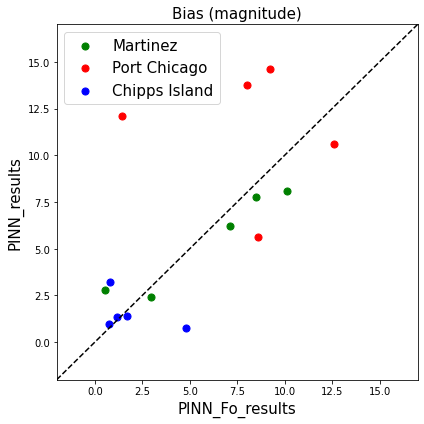

In [107]:
fig = scatter_plotter('PINN_Fo_results', 'PINN_results', 'Bias')

In [110]:
## Save plots
fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", "Bias" + "M+P+C_test (FoNet vs PINN)")
fig.savefig(fig_savepath, bbox_inches='tight',dpi=300)

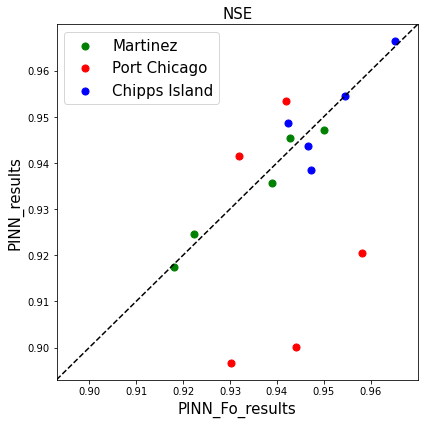

In [113]:
fig = scatter_plotter('PINN_Fo_results', 'PINN_results', 'NSE')

In [114]:
## Save plots
fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", "NSE" + "M+P+C_test (FoNet vs PINN)")
fig.savefig(fig_savepath, bbox_inches='tight',dpi=300)

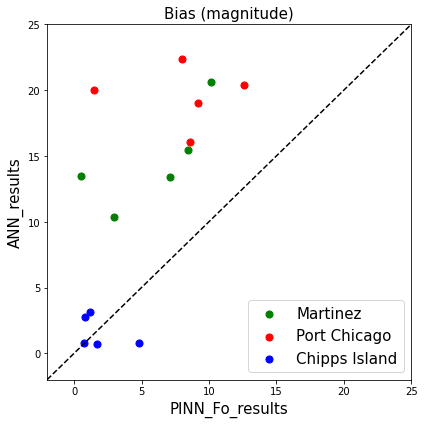

In [37]:
fig = scatter_plotter('PINN_Fo_results', 'ANN_results', 'Bias')

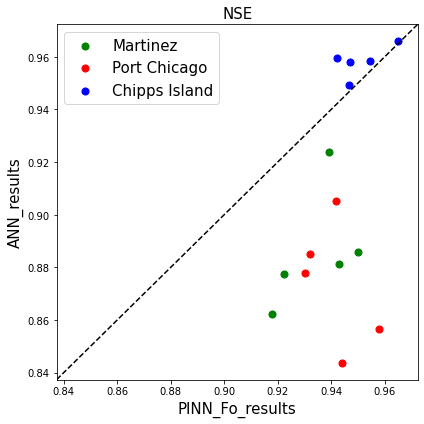

In [38]:
fig = scatter_plotter('PINN_Fo_results', 'ANN_results', 'NSE')

## Time series plots for test set

In [115]:
def plotter(k, RESULTS, xloc, yloc, tst_years):
    """
    Plots and returns PINN and ANN time series plots at three locations for kth fold

    PARAMETERS
    ----------
    k:          int
                kth fold
    RESULTS:    Hash Table
                contains evaluation metrics
    xloc:       int
                x-axis location on plot for evaluation metrics
    yloc:       int
                y-axis location on plot for evaluation metrics
    tst_years:  str list
                testing years
    RETURNS
    -------
    fig1:       matplotlib plot
                time seris of DSM2, PINN, ANN at Martinez
    fig2:       matplotlib plot
                time seris of DSM2, PINN, ANN at Port Chicago
    fig3:       matplotlib plot
                time seris of DSM2, PINN, ANN at Chipps Island
    """

    tst_EC_d = DATA_SET[k]['tst_EC_d']

    PINN_Fo_timeseries_M = RESULTS['Martinez']['PINN_Fo_timeseries']
    PINN_timeseries_M = RESULTS['Martinez']['PINN_timeseries']
    ANN_timeseries_M = RESULTS['Martinez']['ANN_timeseries']
    PINN_Fo_results_M = RESULTS['Martinez']['PINN_Fo_results']
    PINN_results_M = RESULTS['Martinez']['PINN_results']
    ANN_results_M = RESULTS['Martinez']['ANN_results']

    PINN_Fo_timeseries_P = RESULTS['Port Chicago']['PINN_Fo_timeseries']
    PINN_timeseries_P = RESULTS['Port Chicago']['PINN_timeseries']
    ANN_timeseries_P = RESULTS['Port Chicago']['ANN_timeseries']
    PINN_Fo_results_P = RESULTS['Port Chicago']['PINN_Fo_results']
    PINN_results_P = RESULTS['Port Chicago']['PINN_results']
    ANN_results_P = RESULTS['Port Chicago']['ANN_results']

    PINN_Fo_timeseries_C = RESULTS['Chipps Island']['PINN_Fo_timeseries']
    PINN_timeseries_C = RESULTS['Chipps Island']['PINN_timeseries']
    ANN_timeseries_C = RESULTS['Chipps Island']['ANN_timeseries']
    PINN_Fo_results_C = RESULTS['Chipps Island']['PINN_Fo_results']
    PINN_results_C = RESULTS['Chipps Island']['PINN_results']
    ANN_results_C = RESULTS['Chipps Island']['ANN_results']

    ## At Martinez
    fig1 = pl.figure(1, figsize=(24,6))
    pl.plot(tst_EC_d[:, 0] * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='DSM2:daily')
    pl.plot(PINN_Fo_timeseries_M * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN_Fo')
    pl.plot(PINN_timeseries_M * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN')
    pl.plot(ANN_timeseries_M * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='ANN')
    pl.text(xloc, yloc, '          PINN(Fo)     PINN       ANN\nBias | %.3f       %.3f   %.3f\nNSE | %.3f       %.3f    %.3f\n$R^2$    | %.3f       %.3f    %.3f' % (PINN_Fo_results_M['Bias'], PINN_results_M['Bias'], ANN_results_M['Bias'], PINN_Fo_results_M['NSE'], PINN_results_M['NSE'], ANN_results_M['NSE'], PINN_Fo_results_M['R']**2, PINN_results_M['R']**2, ANN_results_M['R']**2), fontsize=20)
    pl.legend(loc='upper left', fontsize=20)
    pl.xticks(np.arange(182.5, len(tst_EC_d), step=365), tst_years, fontsize=20)
    pl.ylabel('EC', fontsize=20)
    pl.title('Martinez (%s-%s)' % (tst_years[0], tst_years[-1]), fontsize=20)
    pl.tight_layout()

    ## At Port Chicago
    fig2 = pl.figure(2, figsize=(24,6))
    pl.plot(tst_EC_d[:, 1] * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='DSM2:daily')
    pl.plot(PINN_Fo_timeseries_P * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN_Fo')
    pl.plot(PINN_timeseries_P * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN')
    pl.plot(ANN_timeseries_P * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='ANN')
    pl.text(xloc, yloc, '          PINN(Fo)     PINN       ANN\nBias | %.3f       %.3f   %.3f\nNSE | %.3f       %.3f    %.3f\n$R^2$    | %.3f       %.3f    %.3f' % (PINN_Fo_results_P['Bias'], PINN_results_P['Bias'], ANN_results_P['Bias'], PINN_Fo_results_P['NSE'], PINN_results_P['NSE'], ANN_results_P['NSE'], PINN_Fo_results_P['R']**2, PINN_results_P['R']**2, ANN_results_P['R']**2), fontsize=20)
    pl.legend(loc='upper left', fontsize=20)
    pl.xticks(np.arange(182.5, len(tst_EC_d), step=365), tst_years, fontsize=20)
    pl.ylabel('EC', fontsize=20)
    pl.title('Port Chicago (%s-%s)' % (tst_years[0], tst_years[-1]), fontsize=20)
    pl.tight_layout()

    ## At Chipps Island
    fig3 = pl.figure(3, figsize=(24,6))
    pl.plot(tst_EC_d[:, 2] * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='DSM2:daily')
    pl.plot(PINN_Fo_timeseries_C * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN_Fo')
    pl.plot(PINN_timeseries_C * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN')
    pl.plot(ANN_timeseries_C * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='ANN')
    pl.text(xloc, yloc, '          PINN(Fo)     PINN       ANN\nBias | %.3f       %.3f    %.3f\nNSE | %.3f       %.3f    %.3f\n$R^2$    | %.3f       %.3f    %.3f' % (PINN_Fo_results_C['Bias'], PINN_results_C['Bias'], ANN_results_C['Bias'], PINN_Fo_results_C['NSE'], PINN_results_C['NSE'], ANN_results_C['NSE'], PINN_Fo_results_C['R']**2, PINN_results_C['R']**2, ANN_results_C['R']**2), fontsize=20)
    pl.legend(loc='upper left', fontsize=20)
    pl.xticks(np.arange(182.5, len(tst_EC_d), step=365), tst_years, fontsize=20)
    pl.ylabel('EC', fontsize=20)
    pl.title('Chipps Island (%s-%s)' % (tst_years[0], tst_years[-1]), fontsize=20)
    pl.tight_layout()

    return fig1, fig2, fig3

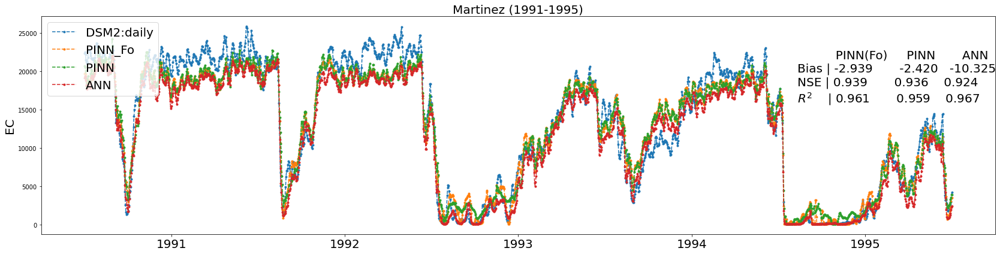

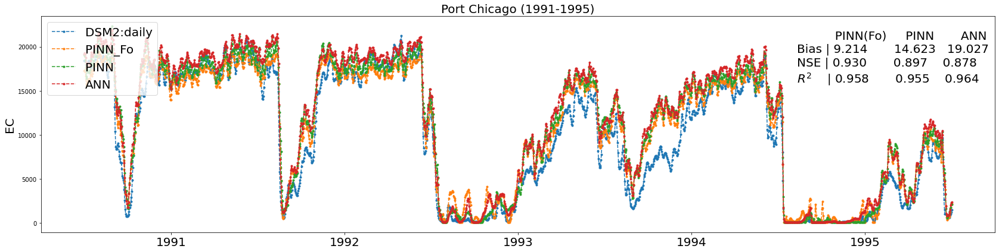

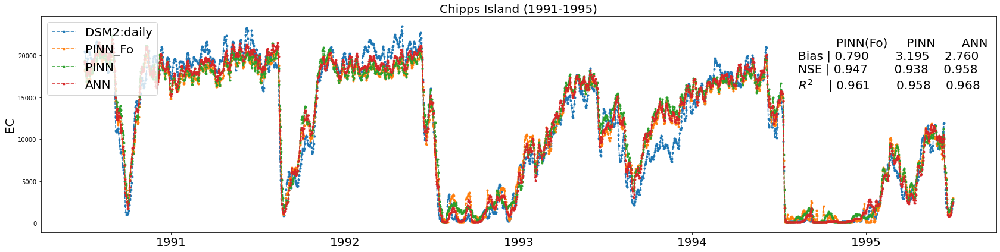

In [121]:
fig1, fig2, fig3 = plotter(1, RESULTS1, 1500, 16000, ['1991','1992','1993','1994','1995'])

In [122]:
kfold = "first"

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Martinez_test (FoNet PINN ANN)")
fig1.savefig(fig_savepath, bbox_inches='tight',dpi=300)

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Port Chicago_test (FoNet PINN ANN)")
fig2.savefig(fig_savepath, bbox_inches='tight',dpi=300)

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Chipps Island_test (FoNet PINN ANN")
fig3.savefig(fig_savepath, bbox_inches='tight',dpi=300)

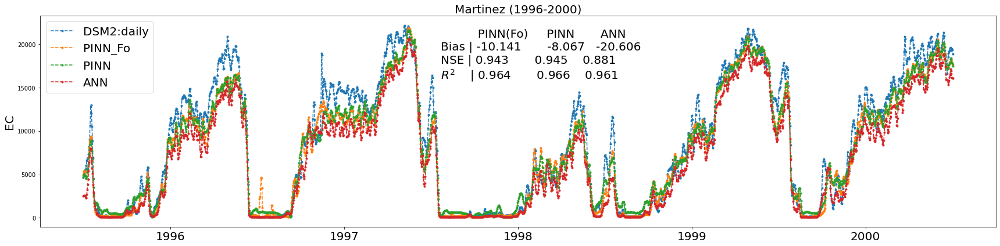

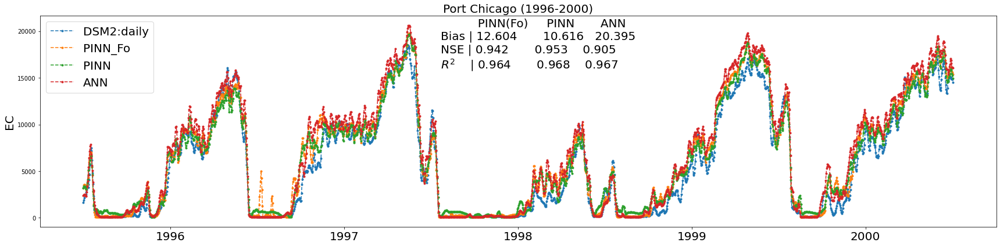

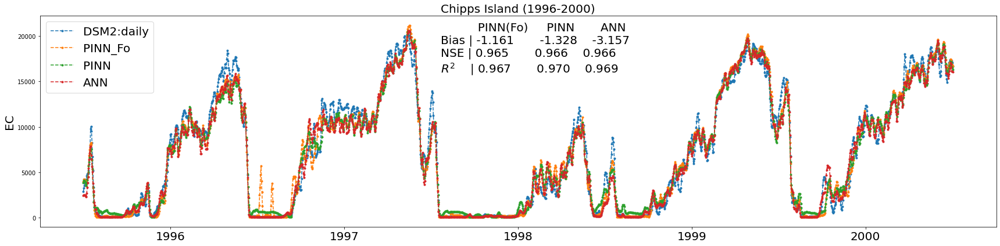

In [123]:
fig1, fig2, fig3 = plotter(2, RESULTS2, 750, 16000, ['1996','1997','1998','1999','2000'])

In [124]:
kfold = "second"

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Martinez_test (FoNet PINN ANN)")
fig1.savefig(fig_savepath, bbox_inches='tight',dpi=300)

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Port Chicago_test (FoNet PINN ANN)")
fig2.savefig(fig_savepath, bbox_inches='tight',dpi=300)

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Chipps Island_test (FoNet PINN ANN")
fig3.savefig(fig_savepath, bbox_inches='tight',dpi=300)

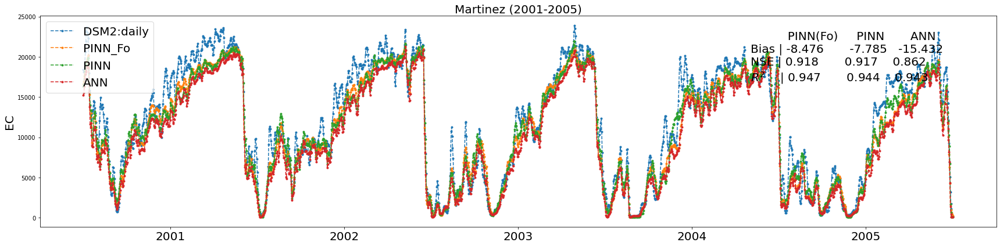

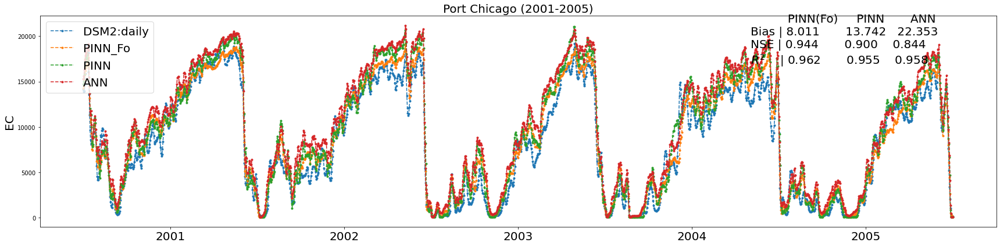

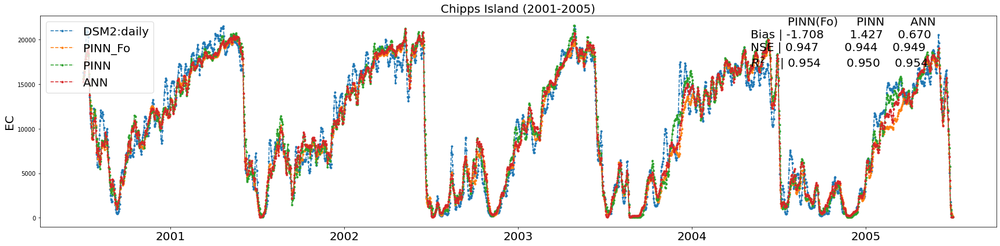

In [126]:
fig1, fig2, fig3 = plotter(3, RESULTS3, 1400, 17000, ['2001','2002','2003','2004','2005'])

In [127]:
kfold = "third"

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Martinez_test (FoNet PINN ANN)")
fig1.savefig(fig_savepath, bbox_inches='tight',dpi=300)

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Port Chicago_test (FoNet PINN ANN)")
fig2.savefig(fig_savepath, bbox_inches='tight',dpi=300)

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Chipps Island_test (FoNet PINN ANN")
fig3.savefig(fig_savepath, bbox_inches='tight',dpi=300)

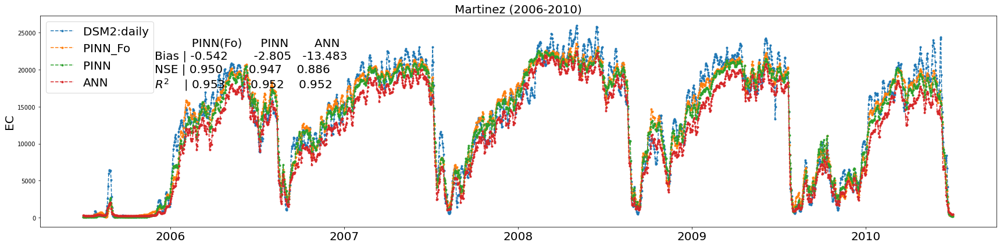

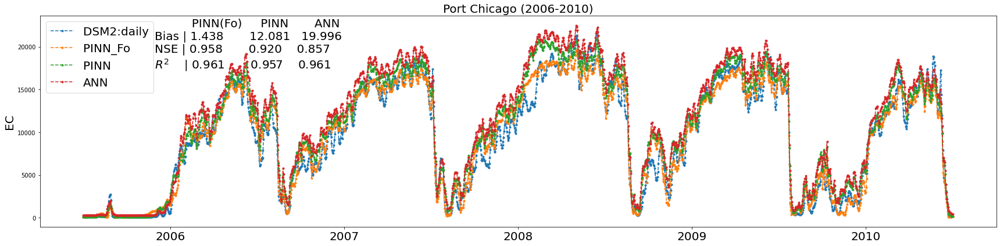

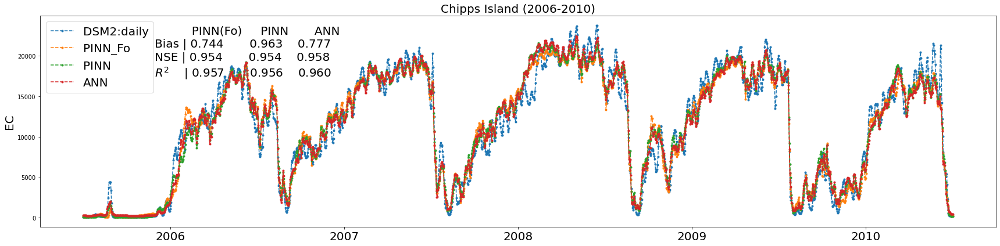

In [129]:
fig1, fig2, fig3 = plotter(4, RESULTS4, 150, 17500, ['2006','2007','2008','2009','2010'])

In [130]:
kfold = "fourth"

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Martinez_test (FoNet PINN ANN)")
fig1.savefig(fig_savepath, bbox_inches='tight',dpi=300)

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Port Chicago_test (FoNet PINN ANN)")
fig2.savefig(fig_savepath, bbox_inches='tight',dpi=300)

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Chipps Island_test (FoNet PINN ANN")
fig3.savefig(fig_savepath, bbox_inches='tight',dpi=300)

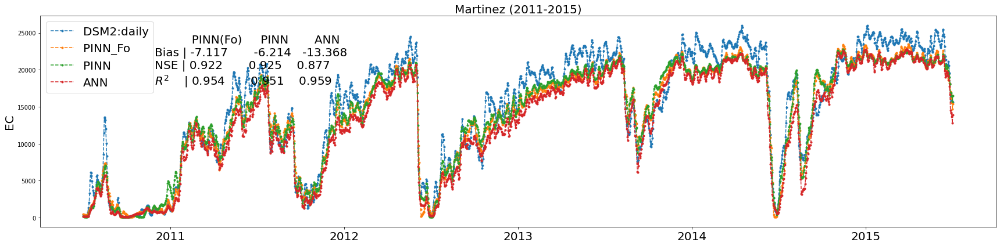

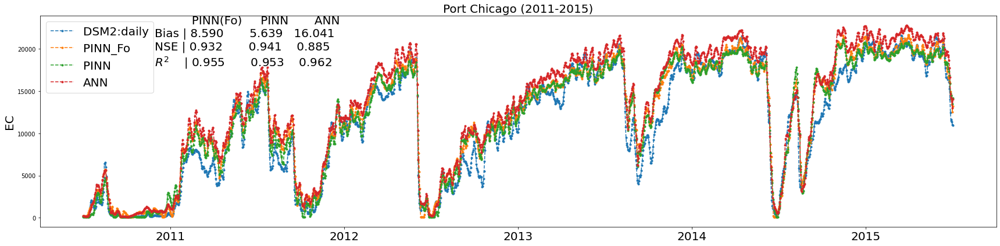

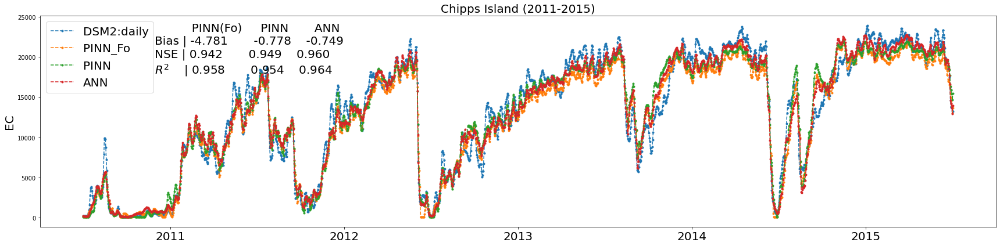

In [132]:
fig1, fig2, fig3 = plotter(5, RESULTS5, 150, 18000, ['2011','2012','2013','2014','2015'])

In [133]:
kfold = "fifth"

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Martinez_test (FoNet PINN ANN)")
fig1.savefig(fig_savepath, bbox_inches='tight',dpi=300)

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Port Chicago_test (FoNet PINN ANN)")
fig2.savefig(fig_savepath, bbox_inches='tight',dpi=300)

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Chipps Island_test (FoNet PINN ANN")
fig3.savefig(fig_savepath, bbox_inches='tight',dpi=300)

In [136]:
def plotter2(k, RESULTS, xloc, yloc, tst_years):
    """
    Plots and returns PINN and ANN time series plots at three locations for kth fold

    PARAMETERS
    ----------
    k:          int
                kth fold
    RESULTS:    Hash Table
                contains evaluation metrics
    xloc:       int
                x-axis location on plot for evaluation metrics
    yloc:       int
                y-axis location on plot for evaluation metrics
    tst_years:  str list
                testing years
    RETURNS
    -------
    fig1:       matplotlib plot
                time seris of DSM2, PINN, ANN at Martinez
    fig2:       matplotlib plot
                time seris of DSM2, PINN, ANN at Port Chicago
    fig3:       matplotlib plot
                time seris of DSM2, PINN, ANN at Chipps Island
    """

    tst_EC_d = DATA_SET[k]['tst_EC_d']

    PINN_Fo_timeseries_M = RESULTS['Martinez']['PINN_Fo_timeseries']
    PINN_timeseries_M = RESULTS['Martinez']['PINN_timeseries']
    ANN_timeseries_M = RESULTS['Martinez']['ANN_timeseries']
    PINN_Fo_results_M = RESULTS['Martinez']['PINN_Fo_results']
    PINN_results_M = RESULTS['Martinez']['PINN_results']
    ANN_results_M = RESULTS['Martinez']['ANN_results']

    PINN_Fo_timeseries_P = RESULTS['Port Chicago']['PINN_Fo_timeseries']
    PINN_timeseries_P = RESULTS['Port Chicago']['PINN_timeseries']
    ANN_timeseries_P = RESULTS['Port Chicago']['ANN_timeseries']
    PINN_Fo_results_P = RESULTS['Port Chicago']['PINN_Fo_results']
    PINN_results_P = RESULTS['Port Chicago']['PINN_results']
    ANN_results_P = RESULTS['Port Chicago']['ANN_results']

    PINN_Fo_timeseries_C = RESULTS['Chipps Island']['PINN_Fo_timeseries']
    PINN_timeseries_C = RESULTS['Chipps Island']['PINN_timeseries']
    ANN_timeseries_C = RESULTS['Chipps Island']['ANN_timeseries']
    PINN_Fo_results_C = RESULTS['Chipps Island']['PINN_Fo_results']
    PINN_results_C = RESULTS['Chipps Island']['PINN_results']
    ANN_results_C = RESULTS['Chipps Island']['ANN_results']

    ## At Martinez
    fig1 = pl.figure(1, figsize=(24,6))
    pl.plot(tst_EC_d[:, 0] * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='DSM2:daily')
    pl.plot(PINN_Fo_timeseries_M * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN_Fo')
    pl.plot(PINN_timeseries_M * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN')
    # pl.plot(ANN_timeseries_M * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='ANN')
    pl.text(xloc, yloc, '          PINN(Fo)     PINN \nBias | %.3f       %.3f\nNSE | %.3f       %.3f\n$R^2$    | %.3f       %.3f' % (PINN_Fo_results_M['Bias'], PINN_results_M['Bias'], PINN_Fo_results_M['NSE'], PINN_results_M['NSE'], PINN_Fo_results_M['R']**2, PINN_results_M['R']**2), fontsize=20)
    pl.legend(loc='upper left', fontsize=20)
    pl.xticks(np.arange(182.5, len(tst_EC_d), step=365), tst_years, fontsize=20)
    pl.ylabel('EC', fontsize=20)
    pl.title('Martinez (%s-%s)' % (tst_years[0], tst_years[-1]), fontsize=20)
    pl.tight_layout()

    ## At Port Chicago
    fig2 = pl.figure(2, figsize=(24,6))
    pl.plot(tst_EC_d[:, 1] * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='DSM2:daily')
    pl.plot(PINN_Fo_timeseries_P * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN_Fo')
    pl.plot(PINN_timeseries_P * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN')
    # pl.plot(ANN_timeseries_P * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='ANN')
    pl.text(xloc, yloc, '          PINN(Fo)     PINN \nBias | %.3f       %.3f\nNSE | %.3f       %.3f\n$R^2$    | %.3f       %.3f' % (PINN_Fo_results_P['Bias'], PINN_results_P['Bias'], PINN_Fo_results_P['NSE'], PINN_results_P['NSE'], PINN_Fo_results_P['R']**2, PINN_results_P['R']**2), fontsize=20)
    pl.legend(loc='upper left', fontsize=20)
    pl.xticks(np.arange(182.5, len(tst_EC_d), step=365), tst_years, fontsize=20)
    pl.ylabel('EC', fontsize=20)
    pl.title('Port Chicago (%s-%s)' % (tst_years[0], tst_years[-1]), fontsize=20)
    pl.tight_layout()

    ## At Chipps Island
    fig3 = pl.figure(3, figsize=(24,6))
    pl.plot(tst_EC_d[:, 2] * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='DSM2:daily')
    pl.plot(PINN_Fo_timeseries_C * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN_Fo')
    pl.plot(PINN_timeseries_C * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN')
    # pl.plot(ANN_timeseries_C * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='ANN')
    pl.text(xloc, yloc, '          PINN(Fo)     PINN \nBias | %.3f       %.3f\nNSE | %.3f       %.3f\n$R^2$    | %.3f       %.3f' % (PINN_Fo_results_C['Bias'], PINN_results_C['Bias'], PINN_Fo_results_C['NSE'], PINN_results_C['NSE'], PINN_Fo_results_C['R']**2, PINN_results_C['R']**2), fontsize=20)
    pl.legend(loc='upper left', fontsize=20)
    pl.xticks(np.arange(182.5, len(tst_EC_d), step=365), tst_years, fontsize=20)
    pl.ylabel('EC', fontsize=20)
    pl.title('Chipps Island (%s-%s)' % (tst_years[0], tst_years[-1]), fontsize=20)
    pl.tight_layout()

    return fig1, fig2, fig3

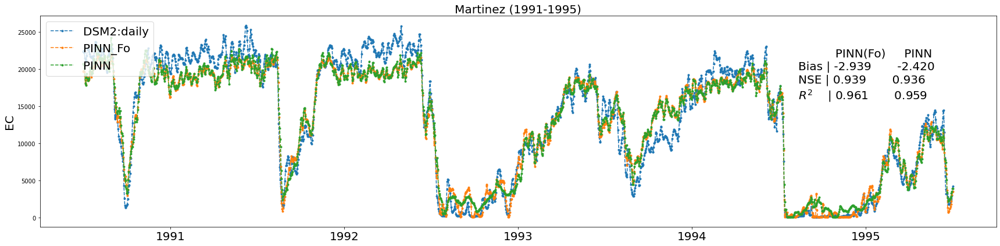

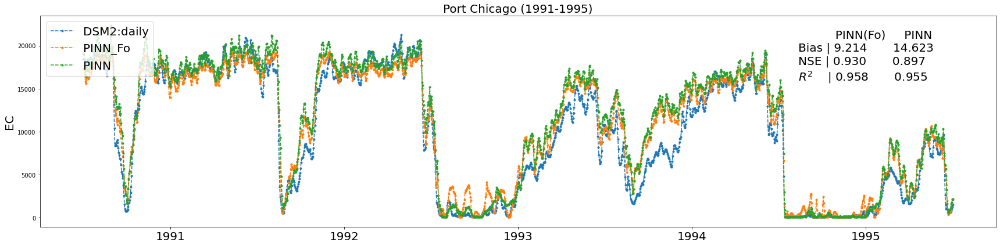

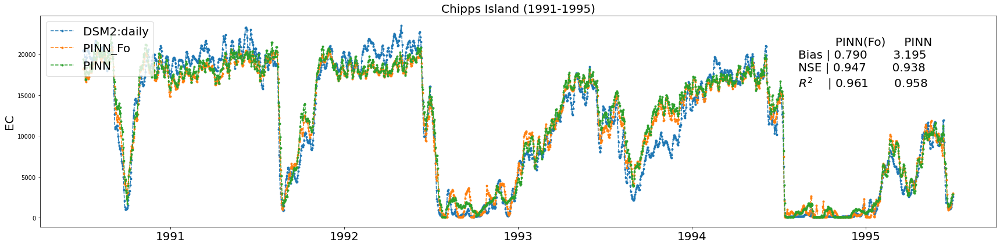

In [137]:
fig1, fig2, fig3 = plotter2(1, RESULTS1, 1500, 16000, ['1991','1992','1993','1994','1995'])

In [138]:
kfold = "first"

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Martinez_test (FoNet PINN)")
fig1.savefig(fig_savepath, bbox_inches='tight',dpi=300)

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Port Chicago_test (FoNet PINN)")
fig2.savefig(fig_savepath, bbox_inches='tight',dpi=300)

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Chipps Island_test (FoNet PINN)")
fig3.savefig(fig_savepath, bbox_inches='tight',dpi=300)

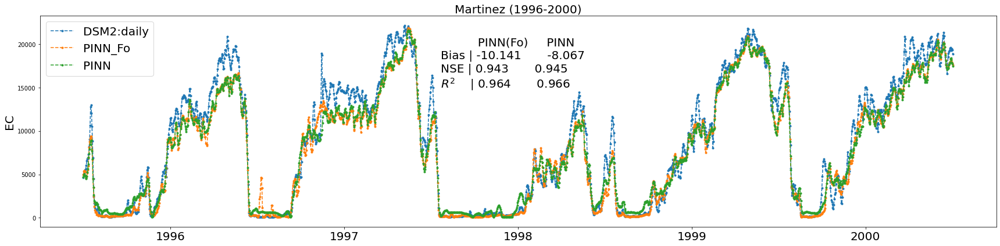

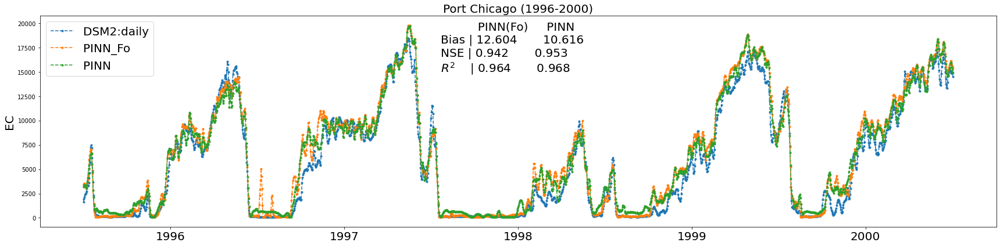

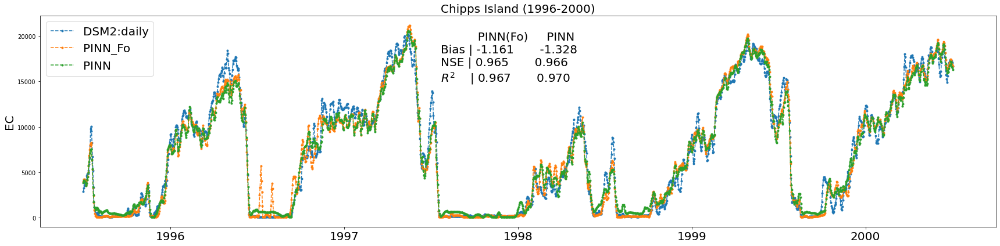

In [140]:
fig1, fig2, fig3 = plotter2(2, RESULTS2, 750, 15000, ['1996','1997','1998','1999','2000'])

In [141]:
kfold = "second"

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Martinez_test (FoNet PINN)")
fig1.savefig(fig_savepath, bbox_inches='tight',dpi=300)

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Port Chicago_test (FoNet PINN)")
fig2.savefig(fig_savepath, bbox_inches='tight',dpi=300)

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Chipps Island_test (FoNet PINN)")
fig3.savefig(fig_savepath, bbox_inches='tight',dpi=300)

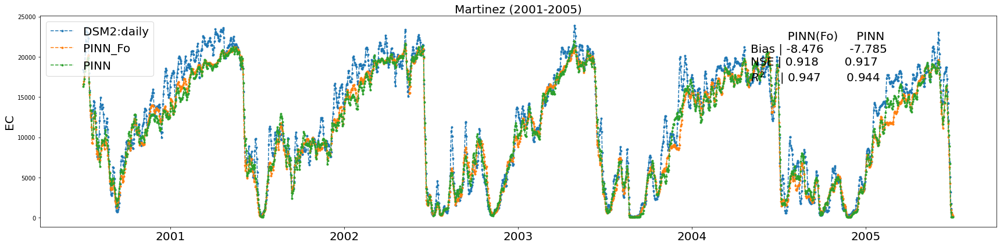

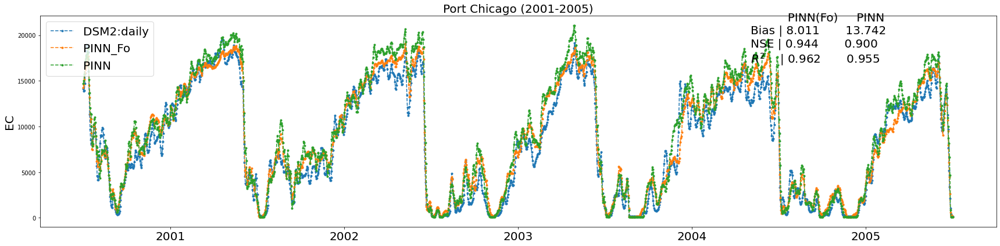

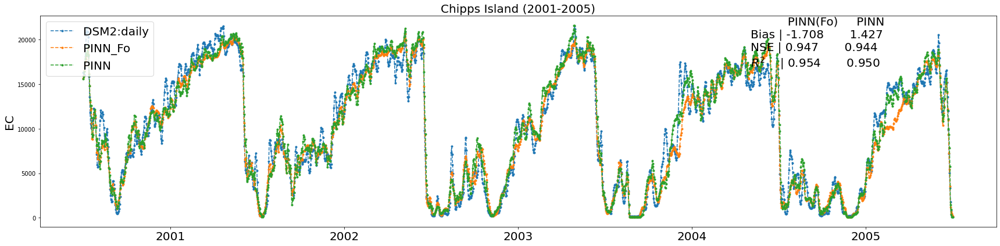

In [142]:
fig1, fig2, fig3 = plotter2(3, RESULTS3, 1400, 17000, ['2001','2002','2003','2004','2005'])

In [143]:
kfold = "third"

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Martinez_test (FoNet PINN)")
fig1.savefig(fig_savepath, bbox_inches='tight',dpi=300)

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Port Chicago_test (FoNet PINN)")
fig2.savefig(fig_savepath, bbox_inches='tight',dpi=300)

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Chipps Island_test (FoNet PINN)")
fig3.savefig(fig_savepath, bbox_inches='tight',dpi=300)

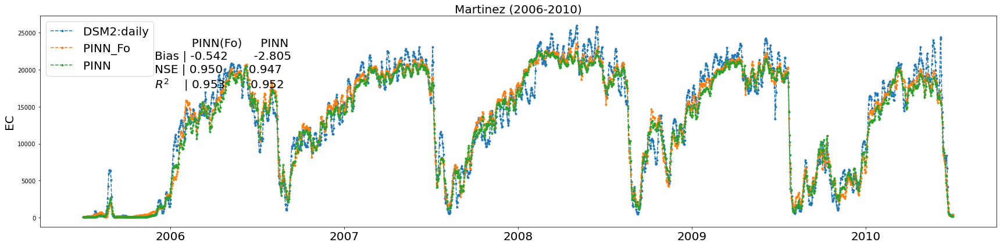

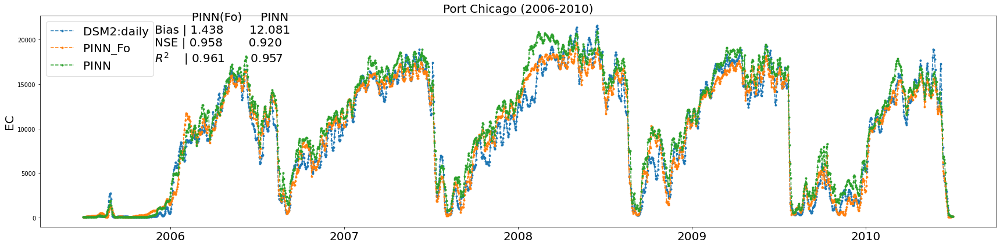

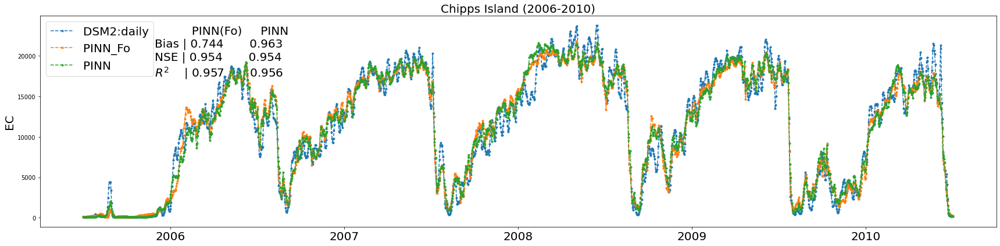

In [144]:
fig1, fig2, fig3 = plotter2(4, RESULTS4, 150, 17500, ['2006','2007','2008','2009','2010'])

In [145]:
kfold = "fourth"

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Martinez_test (FoNet PINN)")
fig1.savefig(fig_savepath, bbox_inches='tight',dpi=300)

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Port Chicago_test (FoNet PINN)")
fig2.savefig(fig_savepath, bbox_inches='tight',dpi=300)

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Chipps Island_test (FoNet PINN)")
fig3.savefig(fig_savepath, bbox_inches='tight',dpi=300)

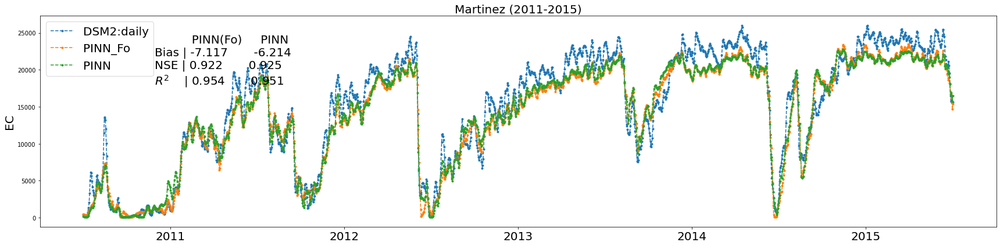

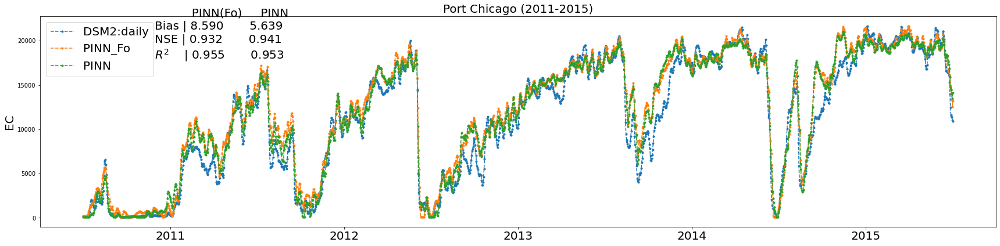

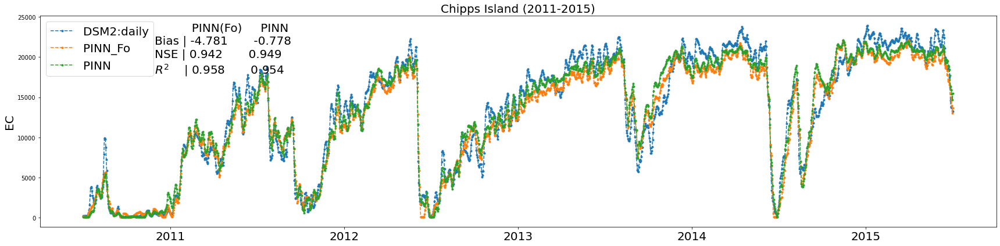

In [146]:
fig1, fig2, fig3 = plotter2(5, RESULTS5, 150, 18000, ['2011','2012','2013','2014','2015'])

In [147]:
kfold = "fifth"

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Martinez_test (FoNet PINN)")
fig1.savefig(fig_savepath, bbox_inches='tight',dpi=300)

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Port Chicago_test (FoNet PINN)")
fig2.savefig(fig_savepath, bbox_inches='tight',dpi=300)

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Chipps Island_test (FoNet PINN)")
fig3.savefig(fig_savepath, bbox_inches='tight',dpi=300)

In [39]:
def plotter3(k, RESULTS, xloc, yloc, tst_years):
    """
    Plots and returns PINN and ANN time series plots at three locations for kth fold

    PARAMETERS
    ----------
    k:          int
                kth fold
    RESULTS:    Hash Table
                contains evaluation metrics
    xloc:       int
                x-axis location on plot for evaluation metrics
    yloc:       int
                y-axis location on plot for evaluation metrics
    tst_years:  str list
                testing years
    RETURNS
    -------
    fig1:       matplotlib plot
                time seris of DSM2, PINN, ANN at Martinez
    fig2:       matplotlib plot
                time seris of DSM2, PINN, ANN at Port Chicago
    fig3:       matplotlib plot
                time seris of DSM2, PINN, ANN at Chipps Island
    """

    tst_EC_d = DATA_SET[k]['tst_EC_d']

    PINN_Fo_timeseries_M = RESULTS['Martinez']['PINN_Fo_timeseries']
    PINN_timeseries_M = RESULTS['Martinez']['PINN_timeseries']
    ANN_timeseries_M = RESULTS['Martinez']['ANN_timeseries']
    PINN_Fo_results_M = RESULTS['Martinez']['PINN_Fo_results']
    PINN_results_M = RESULTS['Martinez']['PINN_results']
    ANN_results_M = RESULTS['Martinez']['ANN_results']

    PINN_Fo_timeseries_P = RESULTS['Port Chicago']['PINN_Fo_timeseries']
    PINN_timeseries_P = RESULTS['Port Chicago']['PINN_timeseries']
    ANN_timeseries_P = RESULTS['Port Chicago']['ANN_timeseries']
    PINN_Fo_results_P = RESULTS['Port Chicago']['PINN_Fo_results']
    PINN_results_P = RESULTS['Port Chicago']['PINN_results']
    ANN_results_P = RESULTS['Port Chicago']['ANN_results']

    PINN_Fo_timeseries_C = RESULTS['Chipps Island']['PINN_Fo_timeseries']
    PINN_timeseries_C = RESULTS['Chipps Island']['PINN_timeseries']
    ANN_timeseries_C = RESULTS['Chipps Island']['ANN_timeseries']
    PINN_Fo_results_C = RESULTS['Chipps Island']['PINN_Fo_results']
    PINN_results_C = RESULTS['Chipps Island']['PINN_results']
    ANN_results_C = RESULTS['Chipps Island']['ANN_results']

    ## At Martinez
    fig1 = pl.figure(1, figsize=(24,6))
    pl.plot(tst_EC_d[:, 0] * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='DSM2:daily')
    pl.plot(PINN_Fo_timeseries_M * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN_Fo')
    # pl.plot(PINN_timeseries_M * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN')
    pl.plot(ANN_timeseries_M * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='ANN')
    pl.text(xloc, yloc, '          PINN(Fo)     ANN \nBias | %.3f       %.3f\nNSE | %.3f       %.3f\n$R^2$    | %.3f       %.3f' % (PINN_Fo_results_M['Bias'], ANN_results_M['Bias'], PINN_Fo_results_M['NSE'], ANN_results_M['NSE'], PINN_Fo_results_M['R']**2, ANN_results_M['R']**2), fontsize=20)
    pl.legend(loc='upper left', fontsize=20)
    pl.xticks(np.arange(182.5, len(tst_EC_d), step=365), tst_years, fontsize=20)
    pl.ylabel('EC', fontsize=20)
    pl.title('Martinez (%s-%s)' % (tst_years[0], tst_years[-1]), fontsize=20)
    pl.tight_layout()

    ## At Port Chicago
    fig2 = pl.figure(2, figsize=(24,6))
    pl.plot(tst_EC_d[:, 1] * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='DSM2:daily')
    pl.plot(PINN_Fo_timeseries_P * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN_Fo')
    # pl.plot(PINN_timeseries_P * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN')
    pl.plot(ANN_timeseries_P * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='ANN')
    pl.text(xloc, yloc, '          PINN(Fo)     PINN \nBias | %.3f       %.3f\nNSE | %.3f       %.3f\n$R^2$    | %.3f       %.3f' % (PINN_Fo_results_P['Bias'], ANN_results_P['Bias'], PINN_Fo_results_P['NSE'], ANN_results_P['NSE'], PINN_Fo_results_P['R']**2, ANN_results_P['R']**2), fontsize=20)
    pl.legend(loc='upper left', fontsize=20)
    pl.xticks(np.arange(182.5, len(tst_EC_d), step=365), tst_years, fontsize=20)
    pl.ylabel('EC', fontsize=20)
    pl.title('Port Chicago (%s-%s)' % (tst_years[0], tst_years[-1]), fontsize=20)
    pl.tight_layout()

    ## At Chipps Island
    fig3 = pl.figure(3, figsize=(24,6))
    pl.plot(tst_EC_d[:, 2] * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='DSM2:daily')
    pl.plot(PINN_Fo_timeseries_C * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN_Fo')
    # pl.plot(PINN_timeseries_C * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='PINN')
    pl.plot(ANN_timeseries_C * (EC_max - EC_min) + EC_min, marker='.', linestyle='dashed', label='ANN')
    pl.text(xloc, yloc, '          PINN(Fo)     PINN \nBias | %.3f       %.3f\nNSE | %.3f       %.3f\n$R^2$    | %.3f       %.3f' % (PINN_Fo_results_C['Bias'], ANN_results_C['Bias'], PINN_Fo_results_C['NSE'], ANN_results_C['NSE'], PINN_Fo_results_C['R']**2, ANN_results_C['R']**2), fontsize=20)
    pl.legend(loc='upper left', fontsize=20)
    pl.xticks(np.arange(182.5, len(tst_EC_d), step=365), tst_years, fontsize=20)
    pl.ylabel('EC', fontsize=20)
    pl.title('Chipps Island (%s-%s)' % (tst_years[0], tst_years[-1]), fontsize=20)
    pl.tight_layout()

    return fig1, fig2, fig3

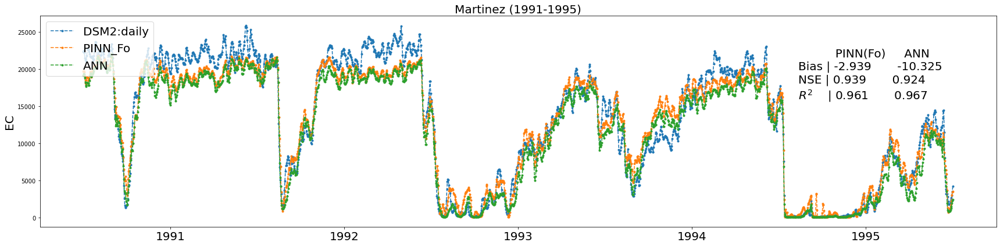

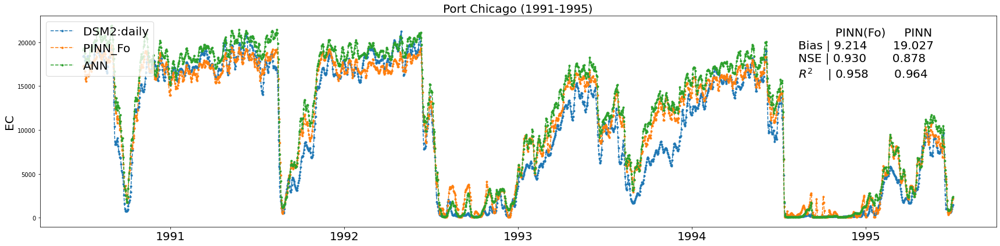

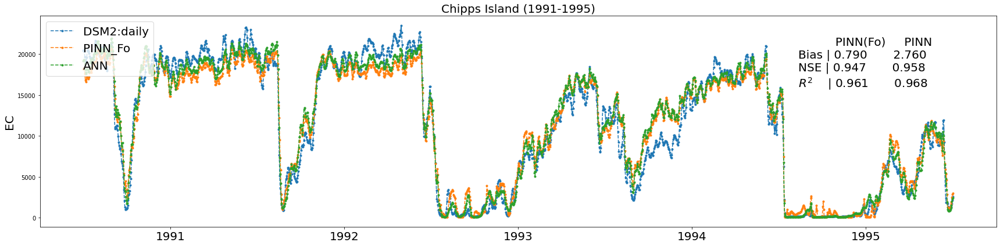

In [41]:
fig1, fig2, fig3 = plotter3(1, RESULTS1, 1500, 16000, ['1991','1992','1993','1994','1995'])

In [42]:
kfold = "first"

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Martinez_test (FoNet ANN)")
fig1.savefig(fig_savepath, bbox_inches='tight',dpi=300)

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Port Chicago_test (FoNet ANN)")
fig2.savefig(fig_savepath, bbox_inches='tight',dpi=300)

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Chipps Island_test (FoNet ANN)")
fig3.savefig(fig_savepath, bbox_inches='tight',dpi=300)

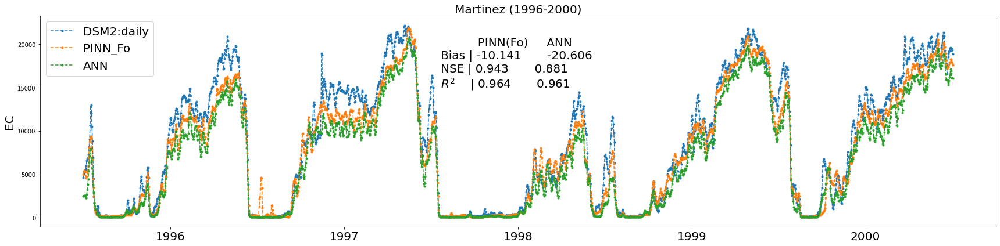

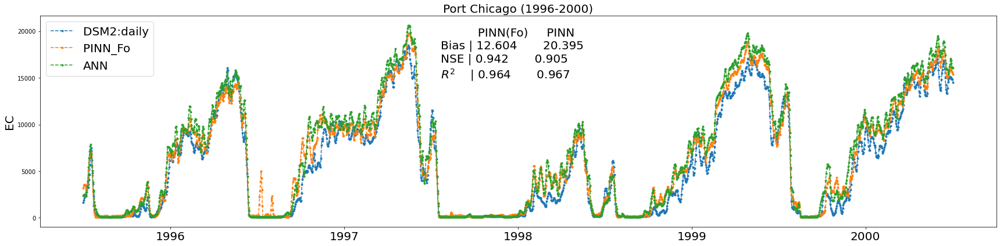

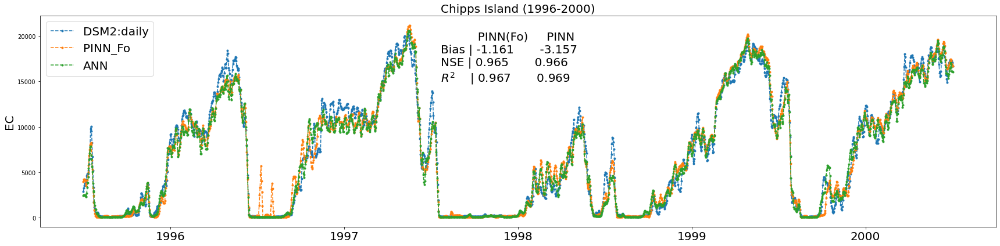

In [43]:
fig1, fig2, fig3 = plotter3(2, RESULTS2, 750, 15000, ['1996','1997','1998','1999','2000'])

In [44]:
kfold = "second"

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Martinez_test (FoNet ANN)")
fig1.savefig(fig_savepath, bbox_inches='tight',dpi=300)

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Port Chicago_test (FoNet ANN)")
fig2.savefig(fig_savepath, bbox_inches='tight',dpi=300)

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Chipps Island_test (FoNet ANN)")
fig3.savefig(fig_savepath, bbox_inches='tight',dpi=300)

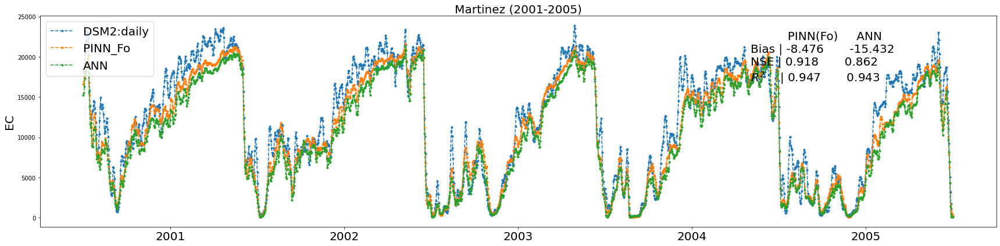

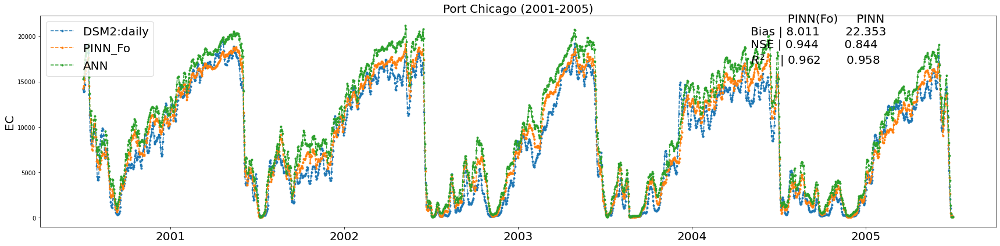

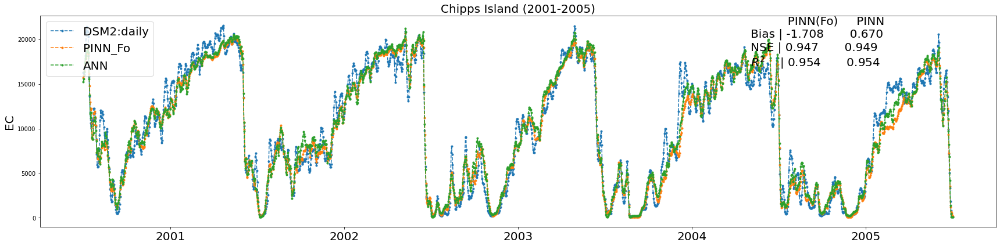

In [45]:
fig1, fig2, fig3 = plotter3(3, RESULTS3, 1400, 17000, ['2001','2002','2003','2004','2005'])

In [46]:
kfold = "third"

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Martinez_test (FoNet ANN)")
fig1.savefig(fig_savepath, bbox_inches='tight',dpi=300)

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Port Chicago_test (FoNet ANN)")
fig2.savefig(fig_savepath, bbox_inches='tight',dpi=300)

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Chipps Island_test (FoNet ANN)")
fig3.savefig(fig_savepath, bbox_inches='tight',dpi=300)

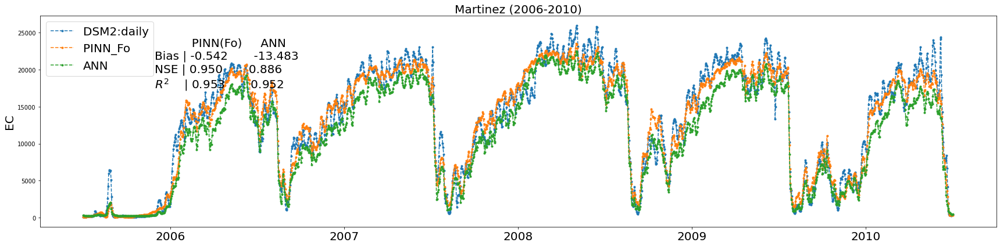

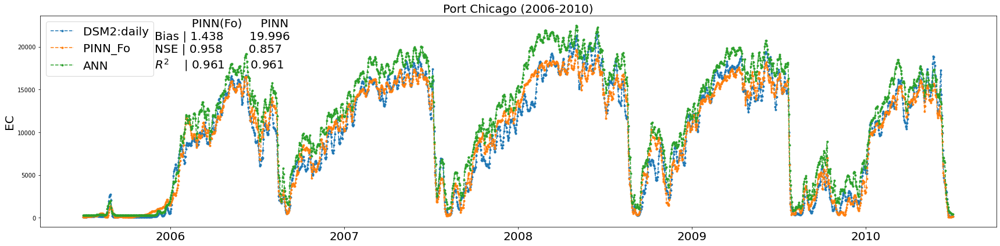

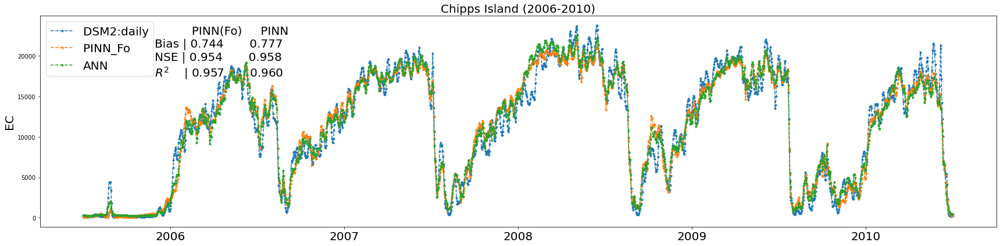

In [47]:
fig1, fig2, fig3 = plotter3(4, RESULTS4, 150, 17500, ['2006','2007','2008','2009','2010'])

In [48]:
kfold = "fourth"

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Martinez_test (FoNet ANN)")
fig1.savefig(fig_savepath, bbox_inches='tight',dpi=300)

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Port Chicago_test (FoNet ANN)")
fig2.savefig(fig_savepath, bbox_inches='tight',dpi=300)

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Chipps Island_test (FoNet ANN)")
fig3.savefig(fig_savepath, bbox_inches='tight',dpi=300)

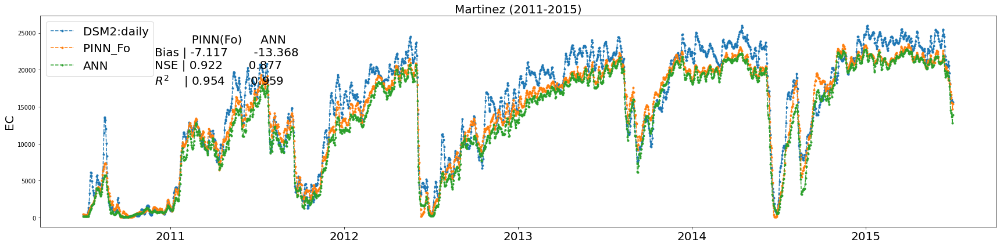

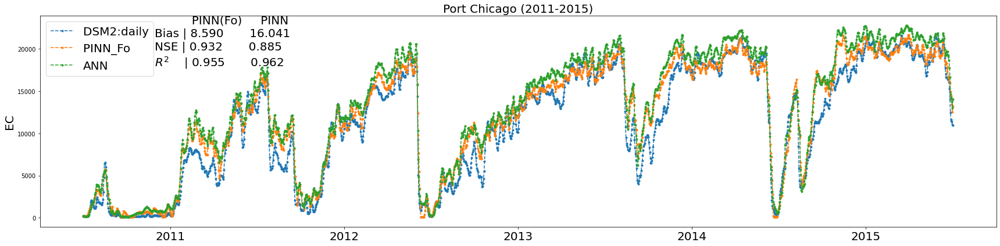

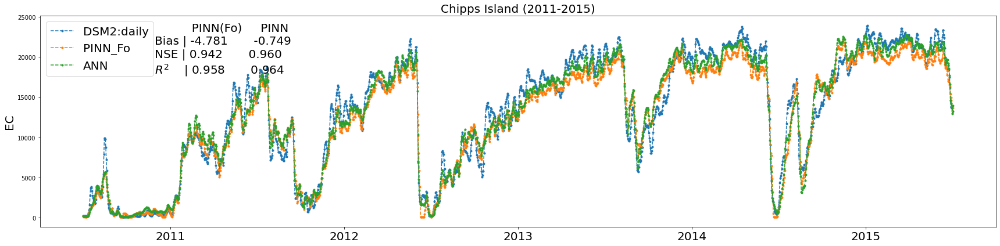

In [49]:
fig1, fig2, fig3 = plotter3(5, RESULTS5, 150, 18000, ['2011','2012','2013','2014','2015'])

In [50]:
kfold = "fifth"

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Martinez_test (FoNet ANN)")
fig1.savefig(fig_savepath, bbox_inches='tight',dpi=300)

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Port Chicago_test (FoNet ANN)")
fig2.savefig(fig_savepath, bbox_inches='tight',dpi=300)

fig_savepath = os.path.join(gdrive_root_path, "images/5-fold", kfold + "_Chipps Island_test (FoNet ANN)")
fig3.savefig(fig_savepath, bbox_inches='tight',dpi=300)

# Test

In [58]:
# Custom Layer - Fourier
class FoNet(keras.layers.Layer):
    def __init__(self, units=32):
        super(FoNet, self).__init__()
        self.units = units

    def build(self, input_shape):
        self.w = self.add_weight(
            shape=(input_shape[-1], self.units),
            initializer="random_normal",
            trainable=True,
            name='name'
        )

    def call(self, inputs):
        out = 2 * np.pi * tf.matmul(inputs, self.w)
        return tf.concat([tf.math.sin(out), tf.math.cos(out)], 1)

    def get_config(self):
        config = super().get_config()
        return config

In [54]:
print(tf.keras.layers.Multiply()([np.arange(5).reshape(5, 1),
                            np.arange(5, 10).reshape(5, 1)]))

Tensor("multiply_1/mul:0", shape=(5, 1), dtype=int64)


In [51]:
np.arange(5).reshape(5, 1)

array([[0],
       [1],
       [2],
       [3],
       [4]])

In [52]:
np.arange(5, 10).reshape(5, 1)

array([[5],
       [6],
       [7],
       [8],
       [9]])

In [69]:
""" 
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""
def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 0.002
        K = 133.959
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2)
    return loss

"""
Define model
"""
# Shared layer structure throughout
Fo = FoNet(4)
Trans_1 = keras.layers.Dense(8, activation='relu')
Trans_2 = keras.layers.Dense(8, activation='relu')

Inp = keras.layers.Input(shape=(20,))
Fo_Inp = Fo(Inp)
Trans_1_1 = Trans_1(Fo_Inp)
Trans_2_1 = Trans_2(Fo_Inp)
shared_layer_1 = keras.layers.Dense(8, activation='elu')
First = keras.layers.Multiply()([1 - shared_layer_1(Inp), Trans_1_1]) + keras.layers.Multiply()([shared_layer_1(Inp), Trans_2_1])
First_dr = keras.layers.Dropout(0.05)(First)
# Fo = FoNet(4)
# Fo_First = Fo(First)
# Trans_1_2 = Trans_1(Fo_First)
# Trans_2_2 = Trans_2(Fo_First)
# shared_layer_2 = keras.layers.Dense(8, activation='sigmoid')
# Second = keras.layers.Multiply()([1 - shared_layer_2(First_dr), Trans_1_2]) + keras.layers.Multiply()([shared_layer_2(First_dr), Trans_2_2])
# Second_dr = keras.layers.Dropout(0.1)(Second)
# Out = keras.layers.Dense(1, activation="linear")(Second_dr)
Out = keras.layers.Dense(1, activation="linear")(First_dr)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        time_callback      
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21915/21915 [==============================] - 4s 179us/sample - loss: 0.0615 - val_loss: 0.0427
Epoch 2/5000
21915/21915 [==============================] - 1s 64us/sample - loss: 0.0230 - val_loss: 0.0287
Epoch 3/5000
21915/21915 [==============================] - 1s 63us/sample - loss: 0.0158 - val_loss: 0.0235
Epoch 4/5000
21915/21915 [==============================] - 1s 65us/sample - loss: 0.0130 - val_loss: 0.0197
Epoch 5/5000
21915/21915 [==============================] - 1s 65us/sample - loss: 0.0117 - val_loss: 0.0167
Epoch 6/5000
21915/21915 [==============================] - 1s 64us/sample - loss: 0.0107 - val_loss: 0.0146
Epoch 7/5000
21915/21915 [==============================] - 1s 64us/sample - loss: 0.0104 - val_loss: 0.0134
Epoch 8/5000
21915/21915 [==============================] - 1s 64us/sample - loss: 0.0097 - val_loss: 0.0123
Epoch 9/5000
21915/21915 [==============================] - 1s 65us/sample - l

In [70]:
## Print evaluation results

PINN_Fo_model1 = model

train_results = evaluate_sequences(Svals, np.maximum(PINN_Fo_model1.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(PINN_Fo_model1.predict(X_tst), 0), eval_metrics)

print("PINN (FoNet) results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("PINN (FoNet) results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

PINN (FoNet) results for training
------------------------------
MSE : 0.00407576
Bias : -1.7858289182186127
R : 0.9766882249423242
RMSD : 0.09298854992230815
NSE : 0.9469432160258293
L2 : 0.1307865


PINN (FoNet) results for testing
------------------------------
MSE : 0.0062859748
Bias : 2.1891145035624504
R : 0.974585679134116
RMSD : 0.09776787229812305
NSE : 0.9282418712973595
L2 : 0.1491799


### PINN (Multi-FoNet)

Hyperparameters:
*   activation_1: relu
*   activation_2: sigmoid
*   nhidden1: 4
*   nhidden2: 8
*   nhidden3: 6

In [72]:
# Custom Layer - Fourier
class FoNet(keras.layers.Layer):
    def __init__(self, units=32):
        super(FoNet, self).__init__()
        self.units = units

    def build(self, input_shape):
        self.w = self.add_weight(
            shape=(input_shape[-1], self.units),
            initializer="random_normal",
            trainable=True,
            name='name'
        )

    def call(self, inputs):
        out = 2 * np.pi * tf.matmul(inputs, self.w)
        # out = 2 * np.pi * inputs
        return tf.concat([tf.math.sin(out), tf.math.cos(out)], 1)

    def get_config(self):
        config = super().get_config()
        return config

In [85]:
""" 
Custom loss function for PINN
    Mean squared error + PDE (1D Advection Dispersion) loss
"""
def PINN_loss(inp):
    def loss(y_true, y_pred):
        A = 0.002
        K = 133.959
        S = y_pred
        Q = inp[2:3]
        dS_x = dde.grad.jacobian(S, inp, i=0, j=0)
        dS_t = dde.grad.jacobian(S, inp, i=0, j=1)
        dS_xx = dde.grad.hessian(S, inp, i=0, j=0)
        mse = tf.keras.losses.MeanSquaredError()
        return mse(y_true, S) + ((A * dS_t - Q * dS_x - K * A * dS_xx) ** 2)
    return loss

"""
Define model
"""
Inp = keras.layers.Input(shape=(20,))
Fo_1 = FoNet(4)(Inp)
Fo_2 = FoNet(4)(Inp)
Fo_3 = FoNet(4)(Inp)
Fo_4 = FoNet(4)(Inp)
shared_layer_1 = keras.layers.Dense(8, activation='relu')
L1_1 = shared_layer_1(Fo_1)
L1_2 = shared_layer_1(Fo_2)
L1_3 = shared_layer_1(Fo_3)
L1_4 = shared_layer_1(Fo_4)
L1_1_dr = keras.layers.Dropout(0.1)(L1_1)
L1_2_dr = keras.layers.Dropout(0.1)(L1_2)
L1_3_dr = keras.layers.Dropout(0.1)(L1_3)
L1_4_dr = keras.layers.Dropout(0.1)(L1_4)
shared_layer_2 = keras.layers.Dense(6, activation='sigmoid')
L2_1 = shared_layer_2(L1_1)
L2_2 = shared_layer_2(L1_2)
L2_3 = shared_layer_2(L1_3)
L2_4 = shared_layer_2(L1_4)
L2_1_dr = keras.layers.Dropout(0.1)(L2_1)
L2_2_dr = keras.layers.Dropout(0.1)(L2_2)
L2_3_dr = keras.layers.Dropout(0.1)(L2_3)
L2_4_dr = keras.layers.Dropout(0.1)(L2_4)
Conc = keras.layers.Concatenate(axis=1)([L2_1_dr, L2_2_dr, L2_3_dr, L2_4_dr])
# Conc_dr = keras.layers.Dropout(0.05)(Conc)
Out = keras.layers.Dense(1, activation="linear")(Conc)
model = keras.Model(Inp, Out)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=keras.optimizers.schedules.InverseTimeDecay(0.001,decay_steps=10,decay_rate=1,staircase=False)), loss=PINN_loss(Inp))

"""
Train model
"""
history = model.fit(X, Svals,
                        epochs=5000,
                        batch_size=128,
                        validation_data=(X_tst, Svals_tst),
                        callbacks=[keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=50,
                                                                mode="min",
                                                                restore_best_weights=True),
                        time_callback      
                                ],
                    )

Train on 21915 samples, validate on 5478 samples
Epoch 1/5000
21915/21915 [==============================] - ETA: 0s - loss: 0.2006

/usr/local/lib/python3.8/dist-packages/keras/engine/training_v1.py:2045: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


21915/21915 [==============================] - 7s 310us/sample - loss: 0.2006 - val_loss: 0.0662
Epoch 2/5000
21915/21915 [==============================] - 2s 111us/sample - loss: 0.1434 - val_loss: 0.0614
Epoch 3/5000
21915/21915 [==============================] - 2s 110us/sample - loss: 0.1384 - val_loss: 0.0598
Epoch 4/5000
21915/21915 [==============================] - 2s 113us/sample - loss: 0.1351 - val_loss: 0.0588
Epoch 5/5000
21915/21915 [==============================] - 2s 113us/sample - loss: 0.1322 - val_loss: 0.0580
Epoch 6/5000
21915/21915 [==============================] - 2s 113us/sample - loss: 0.1327 - val_loss: 0.0574
Epoch 7/5000
21915/21915 [==============================] - 2s 112us/sample - loss: 0.1277 - val_loss: 0.0568
Epoch 8/5000
21915/21915 [==============================] - 3s 114us/sample - loss: 0.1283 - val_loss: 0.0564
Epoch 9/5000
21915/21915 [==============================] - 2s 111us/sample - loss: 0.1246 - val_loss: 0.0560
Epoch 10/5000
21915/219

KeyboardInterrupt: ignored

In [81]:
## Print evaluation results

PINN_MulFo_model1 = model

train_results = evaluate_sequences(Svals, np.maximum(PINN_MulFo_model1.predict(X), 0), eval_metrics)
test_results = evaluate_sequences(Svals_tst, np.maximum(PINN_MulFo_model1.predict(X_tst), 0), eval_metrics)

print("PINN (Multi-FoNet) results for training")
print("-" * 30)
for metric in train_results:
    print(metric, ':', train_results[metric])
print("\n")
print("PINN (Multi-FoNet) results for testing")
print("-" * 30)
for metric in test_results:
    print(metric, ':', test_results[metric])

/usr/local/lib/python3.8/dist-packages/keras/engine/training_v1.py:2067: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


PINN (Multi-FoNet) results for training
------------------------------
MSE : 0.0040139616
Bias : -2.54730898886919
R : 0.9776258845997221
RMSD : 0.09268679345329428
NSE : 0.9477476812899113
L2 : 0.12979117


PINN (Multi-FoNet) results for testing
------------------------------
MSE : 0.0068180026
Bias : 6.001843139529228
R : 0.9725574064704082
RMSD : 0.10059624720252981
NSE : 0.9221684634685516
L2 : 0.15536477
